In [1]:
import math
import os
from PIL import Image

In [2]:
import cv2

In [3]:
%matplotlib notebook

In [3]:
import PIL

In [4]:
import numpy as np

In [5]:
from matplotlib import pyplot as plt

In [6]:
cwd = os.getcwd()

In [7]:
cwd

'/home/UFAD/s.kapoor/GrainGrowth/skapoor/tem_data'

In [8]:
crop_900_pts = np.load('cropped750.npy')

In [9]:
crop_900_pts.shape

(132, 2)

In [11]:
def repeated_2d_array(arr,z_dim):
    repeated_array = np.repeat(np.expand_dims(arr,axis = 0),z_dim,axis = 0)
    return repeated_array

In [12]:
crop_900_pts_3d = repeated_2d_array(crop_900_pts,132)

In [13]:
crop_900_pts_3d.shape

(132, 132, 2)

In [29]:
labels = np.eye(crop_900_pts_3d.shape[0],dtype = np.int)
labels.shape
labels = labels.tolist()

AttributeError: 'list' object has no attribute 'shape'

In [15]:
crop_900_pts_3d = crop_900_pts_3d.tolist()

In [ ]:
for i in range(labels)

In [13]:
def show_points(coords, labels, ax, marker_size=100):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)

In [10]:
def show_points_on_image(raw_image, input_points, input_labels=None):
    plt.figure(figsize=(10,10))
    plt.imshow(raw_image)
    input_points = np.array(input_points)
    if input_labels is None:
      labels = np.ones_like(input_points[:, 0])
    else:
      labels = np.array(input_labels)
    show_points(input_points, labels, plt.gca())
    plt.axis('on')
    plt.show()


In [11]:
raw_image = Image.open('crop_image/cropped750.jpg').convert('RGB')#.transpose(PIL.Image.TRANSPOSE)

In [12]:
raw_image.size

(726, 702)

In [227]:
raw_image.size

(726, 702)

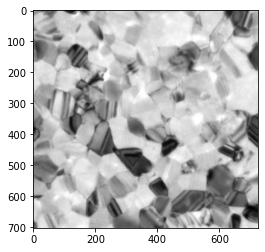

In [14]:
fig = plt.figure()
plt.imshow(raw_image)
plt.show()

In [15]:
crop_900_pts_img = crop_900_pts.tolist()

In [16]:
crop_900_pts.shape

(132, 2)

In [232]:
labels = np.zeros((crop_900_pts.shape[0]),dtype = np.int).tolist()
labels[0] = 1

In [25]:
crop_900_pts_img[-1:]

[[715, 585]]

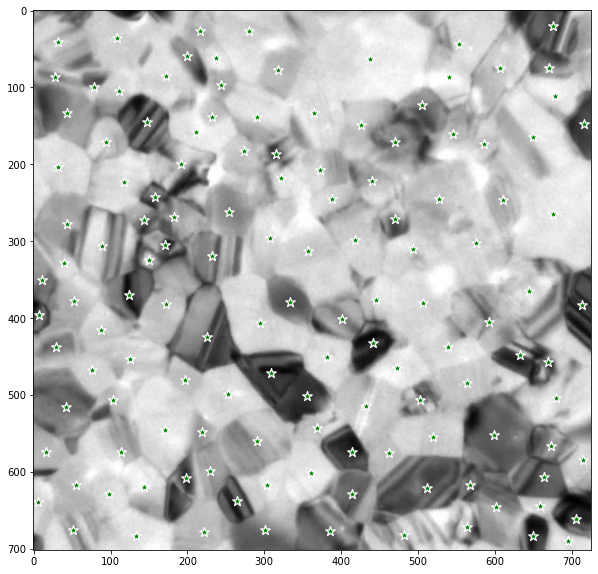

In [213]:
show_points_on_image(raw_image,crop_900_pts_img)

In [23]:
crop_900_pts_token = np.expand_dims(crop_900_pts,axis = 1).tolist()

In [24]:
crop_900_pts_token

[[[108, 36]],
 [[32, 41]],
 [[43, 133]],
 [[94, 171]],
 [[148, 145]],
 [[117, 223]],
 [[32, 203]],
 [[78, 100]],
 [[111, 105]],
 [[172, 85]],
 [[200, 59]],
 [[216, 26]],
 [[237, 62]],
 [[244, 97]],
 [[232, 138]],
 [[280, 27]],
 [[318, 77]],
 [[291, 139]],
 [[274, 183]],
 [[211, 158]],
 [[191, 199]],
 [[315, 186]],
 [[372, 207]],
 [[322, 218]],
 [[357, 313]],
 [[388, 245]],
 [[307, 296]],
 [[418, 299]],
 [[440, 222]],
 [[470, 271]],
 [[365, 133]],
 [[437, 63]],
 [[426, 149]],
 [[470, 171]],
 [[505, 123]],
 [[553, 44]],
 [[607, 74]],
 [[675, 20]],
 [[671, 74]],
 [[678, 111]],
 [[716, 147]],
 [[650, 165]],
 [[676, 265]],
 [[714, 383]],
 [[644, 365]],
 [[633, 448]],
 [[592, 405]],
 [[539, 438]],
 [[564, 484]],
 [[503, 506]],
 [[473, 465]],
 [[441, 432]],
 [[401, 401]],
 [[445, 376]],
 [[519, 555]],
 [[599, 552]],
 [[669, 457]],
 [[680, 504]],
 [[673, 567]],
 [[664, 607]],
 [[659, 645]],
 [[649, 683]],
 [[705, 662]],
 [[695, 690]],
 [[512, 621]],
 [[602, 646]],
 [[414, 629]],
 [[385, 677]],

In [18]:
crop_900_pts.shape

(132, 2)

In [19]:
np.expand_dims(crop_900_pts,axis = 1).shape

(132, 1, 2)

In [13]:
pth = os.getcwd()
model_path = os.path.join(pth,'sam_mode_1')
ats_pth = os.path.join(model_path,'sam_pts')
masks_pth = os.path.join(model_path,'sam_masks')

if os.path.exists(model_path) == False:
    os.mkdir(model_path)
    
    os.mkdir(ats_pth)
    
    os.mkdir(masks_pth)

In [17]:
import torch
from transformers import SamModel, SamProcessor

device = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")
model = SamModel.from_pretrained("facebook/sam-vit-huge").to(device)
processor = SamProcessor.from_pretrained("facebook/sam-vit-huge")

In [21]:
curr_di = os.getcwd()
img_fol = curr_di+"/crop_image"
gg = os.listdir(img_fol)
gg1 = [i for i in gg if (int(i.split('.')[0][7:])>=750 and int(i.split('.')[0][7:])<775)]

In [25]:
img_path = img_fol+"/cropped750.jpg"
raw_image = Image.open(img_path).convert("RGB")
input_points = [crop_900_pts_token]
#input_labels = [labels]

inputs = processor(raw_image, input_points=input_points,return_tensors="pt").to(device)
image_embeddings = model.get_image_embeddings(inputs["pixel_values"])

inputs.pop("pixel_values", None)
inputs.update({"image_embeddings": image_embeddings})

with torch.no_grad():
    outputs = model(**inputs,multimask_output=False)

masks = processor.image_processor.post_process_masks(outputs.pred_masks.cpu(), inputs["original_sizes"].cpu(), inputs["reshaped_input_sizes"].cpu())
scores = outputs.iou_scores

/usr/local/anaconda3/lib/python3.8/site-packages/torch/nn/functional.py:3609: UserWarning: Default upsampling behavior when mode=linear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn(


In [29]:
crop_900_pts_token

[[[108, 36]],
 [[32, 41]],
 [[43, 133]],
 [[94, 171]],
 [[148, 145]],
 [[117, 223]],
 [[32, 203]],
 [[78, 100]],
 [[111, 105]],
 [[172, 85]],
 [[200, 59]],
 [[216, 26]],
 [[237, 62]],
 [[244, 97]],
 [[232, 138]],
 [[280, 27]],
 [[318, 77]],
 [[291, 139]],
 [[274, 183]],
 [[211, 158]],
 [[191, 199]],
 [[315, 186]],
 [[372, 207]],
 [[322, 218]],
 [[357, 313]],
 [[388, 245]],
 [[307, 296]],
 [[418, 299]],
 [[440, 222]],
 [[470, 271]],
 [[365, 133]],
 [[437, 63]],
 [[426, 149]],
 [[470, 171]],
 [[505, 123]],
 [[553, 44]],
 [[607, 74]],
 [[675, 20]],
 [[671, 74]],
 [[678, 111]],
 [[716, 147]],
 [[650, 165]],
 [[676, 265]],
 [[714, 383]],
 [[644, 365]],
 [[633, 448]],
 [[592, 405]],
 [[539, 438]],
 [[564, 484]],
 [[503, 506]],
 [[473, 465]],
 [[441, 432]],
 [[401, 401]],
 [[445, 376]],
 [[519, 555]],
 [[599, 552]],
 [[669, 457]],
 [[680, 504]],
 [[673, 567]],
 [[664, 607]],
 [[659, 645]],
 [[649, 683]],
 [[705, 662]],
 [[695, 690]],
 [[512, 621]],
 [[602, 646]],
 [[414, 629]],
 [[385, 677]],

In [234]:
masks[0].shape

torch.Size([132, 1, 702, 726])

In [23]:
raw_image.size

(726, 702)

In [18]:
def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)

In [19]:
def show_masks_on_image_2(raw_image,masks):
    if len(masks.shape) == 4:
      masks = masks.squeeze()

    fig,axes = plt.subplots(1,2,figsize = (8,8))
    axes[0].imshow(raw_image)
    axes[1].imshow(raw_image)
    print(masks.shape)
    for mask in masks:
        mask = mask.cpu().detach()
        show_mask(mask,axes[1],True)
    plt.show()

torch.Size([132, 702, 726])


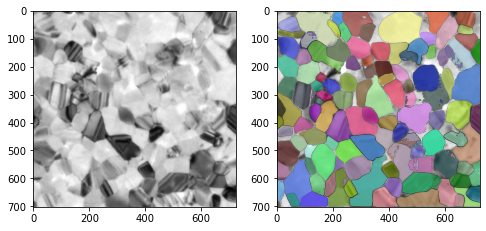

In [26]:
show_masks_on_image_2(raw_image,masks[0])

In [27]:
gg_concat_mask = masks[0].cpu().numpy()

In [31]:
from tqdm import tqdm

In [38]:
from collections import deque

In [42]:
#### concateneating masksto fill in the gaps present in between
## before that closing the masks removing any spaced occurences.not completely cyclic ones
## getting all mask closed
a,b,_,_ = gg_concat_mask.shape
gg_concat_mask_closed = np.zeros_like(gg_concat_mask)
for i in tqdm(range(a)):
    for j in range(b):
        gg_concat_mask_closed[i][j] = get_mask_closed(gg_concat_mask[i][j])

100%|██████████| 132/132 [00:07<00:00, 18.46it/s]


In [41]:
def dce(ground_truth,prediction):
    intersection = np.sum(cv2.bitwise_and(ground_truth,prediction))
    cardinal_sum = np.sum(ground_truth) + np.sum(prediction)
    f1 = 2*intersection/cardinal_sum
    return f1

In [299]:
round(dce(some_mask,some_mask_2),4)

0.9005

In [44]:
import numpy as np

In [49]:
dil_kernel =  np.ones((5,5),np.uint8)

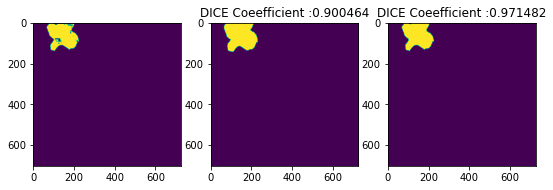

In [50]:
fig,axs = plt.subplots(1,3,figsize = (9,9))
some_mask = get_mask_closed(gg_concat_mask[9][j])
some_mask = np.array(some_mask,np.uint8)
axs[0].imshow(some_mask)
some_mask_2 = cv2.dilate(some_mask,dil_kernel,iterations = 2)
axs[1].imshow(some_mask_2)
axs[1].title.set_text("DICE Coeefficient :"+ str(round(dce(some_mask,some_mask_2),6)))
some_mask_3 = cv2.erode(some_mask_2,dil_kernel,iterations = 2)
axs[2].imshow(some_mask_3)
axs[2].title.set_text("DICE Coeefficient :"+ str(round(dce(some_mask,some_mask_3),6)))


In [36]:
def get_mask_closed_filled(gg_mask):
    
    
    
    gg_mask_y,gg_mask_x = get_centroid(gg_mask)
    gg_mask_closed = np.zeros_like(gg_mask)
    gg_mask_closed[gg_mask_y,gg_mask_x] = gg_mask[gg_mask_y,gg_mask_x]
    m,n = gg_mask.shape
    
    que_mask = deque([])
    que_mask.append([gg_mask_y,gg_mask_x])
    
    while(len(que_mask)!=0):
    #print(len(que_mask))
        y,x = que_mask.popleft()
    #print(y,x)
    #gg_mask_closed[y][x] = gg_mask[y][x]
        for i,j in dirs:
            k = y+i
            l = x+j
            if(k>=0 and k<m and l>=0 and l<n and gg_mask[k][l] == 1 and gg_mask_closed[k][l] == 0):
                gg_mask_closed[k][l] = gg_mask[k][l]
                #print(k,l)
                que_mask.append([k,l])
    
    gg_mask_closed = np.array(gg_mask_closed,np.uint8)
    dil_kernel = np.ones((5,5),np.uint8)
    gg_mask_closed = cv2.dilate(gg_mask_closed,dil_kernel,iterations = 2)
    gg_mask_closed = cv2.erode(gg_mask_closed,dil_kernel,iterations = 2)
    
    return gg_mask_closed

(132, 702, 726)


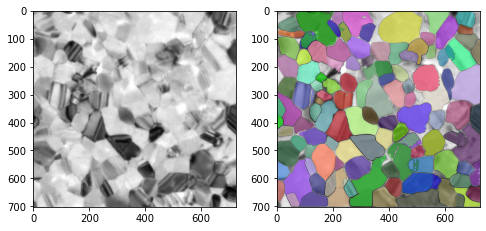

In [54]:
show_masks_on_image_2(raw_image,gg_concat_mask_closed)

In [55]:
#### concateneating masks to fill in the gaps present in between
## before that closing the masks removing any spaced occurences.not completely cyclic ones. also filling inner loops
## with dilation and erosion
## getting all mask closed
a,b,_,_ = gg_concat_mask.shape
gg_concat_mask_closed = np.zeros_like(gg_concat_mask)
for i in tqdm(range(a)):
    for j in range(b):
        gg_concat_mask_closed[i][j] = get_mask_closed_filled(gg_concat_mask[i][j])

100%|██████████| 132/132 [00:16<00:00,  7.97it/s]


(132, 702, 726)


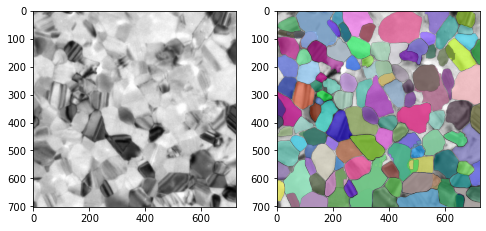

In [56]:
show_masks_on_image_2(raw_image,gg_concat_mask_closed)

In [180]:
np.max(gg_concat_mask_closed[1])

1

In [57]:
gg_concat_mask_closed.shape

(132, 1, 702, 726)

In [58]:
gg_concat_mask_closed[0][0].shape

(702, 726)

In [59]:
gg_concat_mask_1 = np.zeros_like(gg_concat_mask_closed[0][0])

In [60]:
gg_concat_mask_1.shape

(702, 726)

In [61]:
import cv2

In [62]:
gg_concat_mask_closed.shape

(132, 1, 702, 726)

In [117]:
gg_concat_mask_closed = np.array(gg_concat_mask_closed,np.uint8)
gg_concat_mask_1 = np.zeros_like(gg_concat_mask_closed[0][0],np.uint8)

In [118]:
a,b,_,_ = gg_concat_mask_closed.shape
for i in tqdm(range(a)):
    for j in range(b):
        gg_concat_mask_1 = cv2.bitwise_or(gg_concat_mask_1,gg_concat_mask_closed[i][j])

100%|██████████| 132/132 [00:00<00:00, 14481.28it/s]


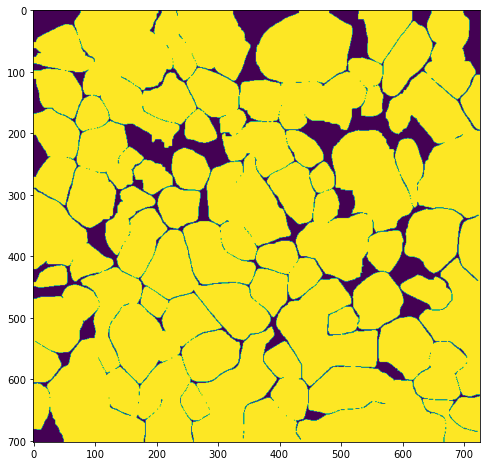

In [119]:
fig = plt.figure(figsize = (8,8))
plt.imshow(gg_concat_mask_1)

In [137]:
#dilate the grains to remove the grain boundaries.
gg_concat_mask_2 = np.zeros_like(gg_concat_mask_closed[0][0],np.uint8)
a,b,_,_ = gg_concat_mask_closed.shape
dil_kernel = np.ones((5,5),np.uint8)
for i in tqdm(range(a)):
    for j in range(b):
        gg_dil_mask = cv2.dilate(gg_concat_mask_closed[i][j],dil_kernel,iterations = 1)
        gg_concat_mask_2 = cv2.bitwise_or(gg_concat_mask_2,gg_dil_mask)

100%|██████████| 132/132 [00:00<00:00, 3385.03it/s]


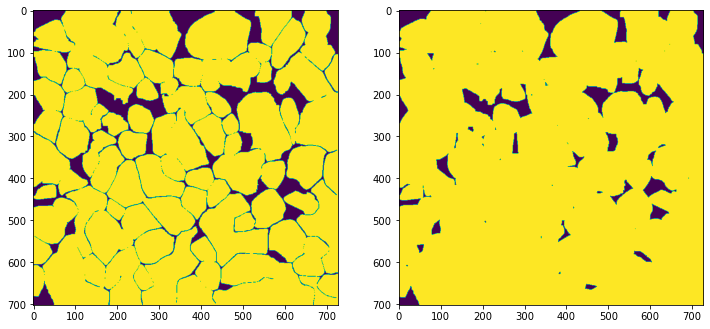

In [138]:
fig,axs = plt.subplots(1,2,figsize = (12,12))
axs[0].imshow(gg_concat_mask_1)
axs[1].imshow(gg_concat_mask_2)

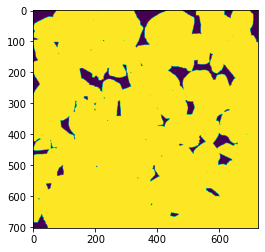

In [159]:
plt.imshow(gg_concat_mask_2)

In [160]:
np.max(gg_concat_mask_2)

1

In [163]:
height,width = gg_concat_mask_2.shape

In [164]:
gg_concat_extra_mask = np.zeros_like(gg_concat_mask)

In [ ]:
cnt = 2

In [165]:
dirs

[[0, 1], [0, -1], [1, 0], [-1, 0]]

In [166]:
dirs = [[0,1],[0,-1],[1,0],[-1,0],[1,1],[-1,-1],[1,-1],[-1,1]]

In [167]:
gg_concat_mask_2.shape

(702, 726)

In [ ]:
while(len(que_mask)!=0):
    #print(len(que_mask))
    y,x = que_mask.popleft()
    #print(y,x)
    #gg_mask_closed[y][x] = gg_mask[y][x]
    for i,j in dirs:
        k = y+i
        l = x+j
        if(k>=0 and k<m and l>=0 and l<n and gg_mask[k][l] == 1 and gg_mask_closed[k][l] == 0):
            gg_mask_closed[k][l] = gg_mask[k][l]
            #print(k,l)
            que_mask.append([k,l])

In [174]:
def fill_empty(m,n,gg_concat_mask_2,cnt):
    gg_mask = np.zeros_like(gg_concat_mask_2)
    que = deque([])
    gg_mask[m][n] = cnt
    que.append([m,n])
    height,width = gg_concat_mask_2.shape
    dirs = [[0,1],[0,-1],[1,0],[-1,0],[1,1],[-1,-1],[1,-1],[-1,1]]
    while(len(que)!=0):
        y,x = que.popleft()
        for i,j in dirs:
            k = y+i
            l = x+j
            if(k>=0 and k<height and l>=0 and l<width and gg_concat_mask_2[k][l] == 0 and gg_mask[k][l] == 0):
                gg_mask[k][l] = cnt
                que.append([k,l])
    
    return gg_mask

In [177]:
cnt = 2
gg_concat_extra_mask = np.zeros_like(gg_concat_mask_2)
for m in range(height):
    for n in tqdm(range(width)):
        
        if(gg_concat_mask_2[m][n] == 0 and gg_concat_extra_mask[m][n] == 0):
            gg_concat_extra_mask = np.maximum(fill_empty(m,n,gg_concat_mask_2,cnt),gg_concat_extra_mask)
            cnt = cnt+1

100%|██████████| 726/726 [00:00<00:00, 407421.02it/s]


100%|██████████| 726/726 [00:00<00:00, 371848.17it/s]


100%|██████████| 726/726 [00:00<00:00, 534034.50it/s]


100%|██████████| 726/726 [00:00<00:00, 542115.85it/s]


100%|██████████| 726/726 [00:00<00:00, 495696.68it/s]


In [181]:
gg_concat_mask_closed_clone = np.array(gg_concat_mask_closed)

In [182]:
gg_concat_mask_closed_clone.shape

(132, 1, 702, 726)

In [188]:
cnt = 1
gg_concat_mask_closed_clone = np.array(gg_concat_mask_closed)
gg_concat_extra_mask = np.zeros_like(gg_concat_mask_2)
for m in range(height):
    for n in tqdm(range(width)):
        
        if(gg_concat_mask_2[m][n] == 0 and gg_concat_extra_mask[m][n] == 0):
            dom_mask = fill_empty(m,n,gg_concat_mask_2,cnt)
            dom_mask = np.expand_dims(np.expand_dims(dom_mask,axis = 0),axis = 0)
            #print(dom_mask.shape)
            gg_concat_mask_closed_clone = np.append(gg_concat_mask_closed_clone,dom_mask,axis = 0)
            #print(gg_concat_mask_closed_clone.shape)
            gg_concat_extra_mask = np.maximum(fill_empty(m,n,gg_concat_mask_2,cnt),gg_concat_extra_mask)
            #break
    #break

100%|██████████| 726/726 [00:00<00:00, 445445.39it/s]


100%|██████████| 726/726 [00:00<00:00, 512982.60it/s]


100%|██████████| 726/726 [00:00<00:00, 521058.30it/s]


100%|██████████| 726/726 [00:00<00:00, 10066.03it/s]


100%|██████████| 726/726 [00:00<00:00, 475271.53it/s]


In [189]:
gg_concat_mask_closed_clone.shape

(196, 1, 702, 726)

(196, 702, 726)


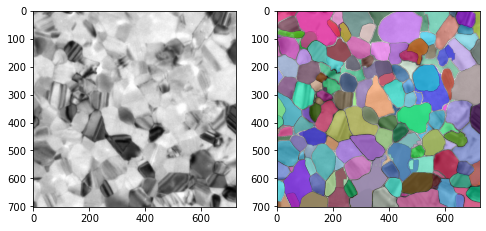

In [190]:
show_masks_on_image_2(raw_image,gg_concat_mask_closed_clone)

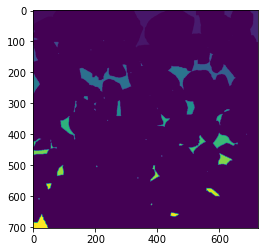

In [178]:
plt.imshow(gg_concat_extra_mask)

In [151]:
some_arr = np.array(gg_concat_mask_1 == 0,np.uint8)

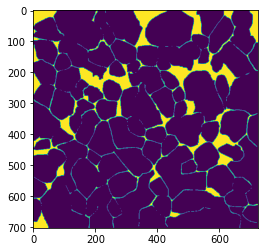

In [152]:
plt.imshow(some_arr)

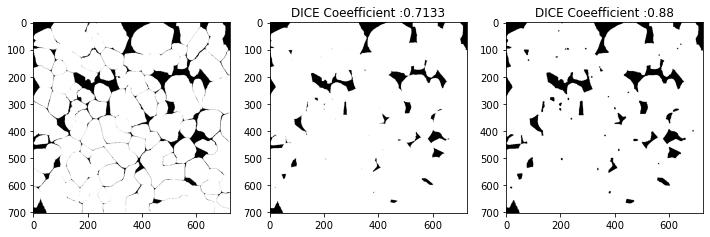

In [158]:
erd_kernel = np.ones((3,3),np.uint8)
erd_gg_concat = cv2.erode(some_arr,erd_kernel,iterations=2)
fig,axs = plt.subplots(1,3,figsize=(12,12))
axs[0].imshow(some_arr,cmap)
axs[1].imshow(erd_gg_concat,cmap)
axs[1].title.set_text("DICE Coeefficient :"+ str(round(dce(some_arr,erd_gg_concat),4)))
dil_kernel = np.ones((3,3),np.uint8)
dil_gg_concat = cv2.dilate(erd_gg_concat,dil_kernel,iterations = 2)

axs[2].imshow(dil_gg_concat,cmap)
axs[2].title.set_text("DICE Coeefficient :"+ str(round(dce(some_arr,dil_gg_concat),4)))

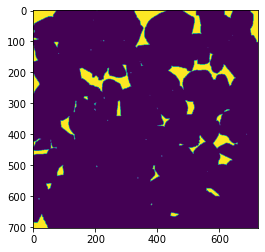

In [154]:
plt.imshow(cv2.erode(some_arr,np.ones((3,3),np.uint8),iterations = 2))

In [66]:
cmap = 'Greys'

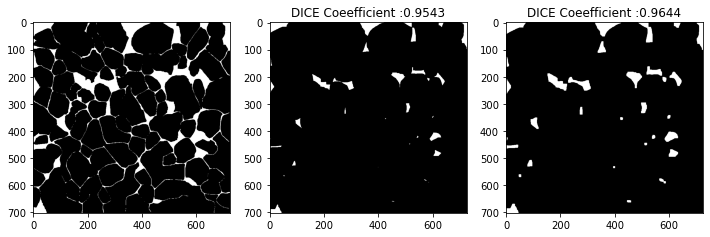

In [74]:
dil_kernel = np.ones((3,3),np.uint8)
dil_gg_concat = cv2.dilate(some_mask,dil_kernel,iterations=2)
fig,axs = plt.subplots(1,3,figsize=(12,12))
axs[0].imshow(gg_concat_mask_1,cmap)
axs[1].imshow(dil_gg_concat,cmap)
axs[1].title.set_text("DICE Coeefficient :"+ str(round(dce(gg_concat_mask_1,dil_gg_concat),4)))
erd_kernel = np.ones((3,3),np.uint8)
dil_gg_concat = cv2.erode(dil_gg_concat,erd_kernel,iterations = 3)

axs[2].imshow(dil_gg_concat,cmap)
axs[2].title.set_text("DICE Coeefficient :"+ str(round(dce(gg_concat_mask_1,dil_gg_concat),4)))

In [144]:
mask_arr = []
scores_arr = []

for i in gg1:
    
    img_path = img_fol+"/"+i
    raw_image = Image.open(img_path).convert("RGB")
    input_points = [crop_900_pts_token]
    
    inputs = processor(raw_image, input_points=input_points, return_tensors="pt").to(device)
    image_embeddings = model.get_image_embeddings(inputs["pixel_values"])
    
    inputs.pop("pixel_values", None)
    inputs.update({"image_embeddings": image_embeddings})

    with torch.no_grad():
        outputs = model(**inputs,multimask_output=False)
    
    masks = processor.image_processor.post_process_masks(outputs.pred_masks.cpu(), inputs["original_sizes"].cpu(), inputs["reshaped_input_sizes"].cpu())
    scores = outputs.iou_scores
    
    masks = masks[0].cpu().detach().numpy()
    scores = scores[0].cpu().detach().numpy()
    
    mask_arr.append(masks)
    scores_arr.append(scores)

In [66]:
masks[0].size()

torch.Size([132, 1, 702, 726])

In [67]:
scores.size()

torch.Size([1, 132, 1])

In [64]:
len(mask_arr)

25

In [65]:
len(scores_arr)

25

In [71]:
scores_arr[0].shape

(132, 1)

In [79]:
scores_arr[0][0][0]

0.74014676

In [145]:
arr = np.zeros((132,25,3))
mask_3d = np.zeros((132,25,702,726))
i = 0
for masks in mask_arr:
    j = 0
    for mask in masks:
        # x,y,score
        mask = np.squeeze(mask)
        xs,ys = np.where(mask == True)
        xs = np.mean(xs)
        ys = np.mean(ys)
        score = scores_arr[i][j][0]
        arr[j,i,:] = np.array([xs,ys,score])
        mask_3d[j,i,:] = mask
        j = j+1
    i = i+1

In [23]:
import matplotlib.pyplot as plt

In [24]:
from mpl_toolkits import mplot3d

In [25]:
from mpl_toolkits.mplot3d import Axes3D

In [100]:
mask_3d[0][0].shape

(702, 726)

In [105]:
x.shape

(726, 702)

In [103]:
y.shape

(726, 702)

In [109]:
matrix1 = np.random.rand(10, 10)
x, y = np.meshgrid(np.arange(matrix1.shape[0]), np.arange(matrix1.shape[1]))

In [112]:
x.shape

(726, 726)

In [117]:
mask_3d[0][0].shape

(702, 726)

In [122]:
mask_3d[0].shape


(25, 702, 726)

In [128]:
indices = np.where(mask_3d[0][0,:,:]==1)


(array([  0,   0,   0, ..., 124, 125, 125]),
 array([ 80,  81,  82, ..., 178, 176, 177]))

In [124]:
x

array([  0,   0,   0, ..., 124, 125, 125])

In [125]:
y

array([ 80,  81,  82, ..., 178, 176, 177])

In [146]:
%matplotlib widget

<IPython.core.display.Javascript object>


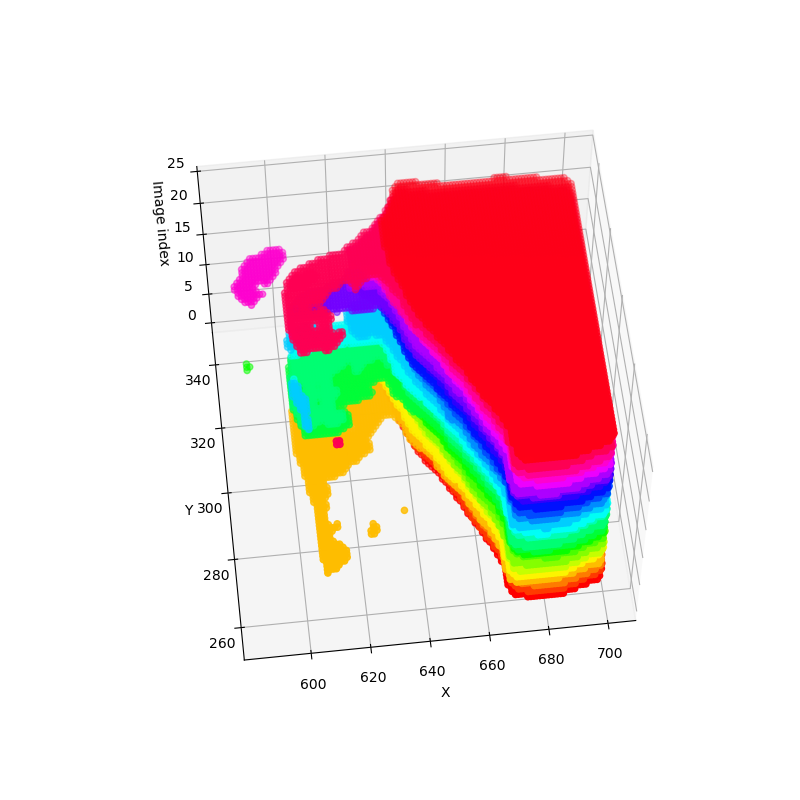

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

In [148]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(111,projection = '3d')

idx = 68

colors = plt.cm.hsv(np.linspace(0,1,mask_3d[idx].shape[0]))

for i in range(mask_3d[idx].shape[0]):
    
    indices = np.where(mask_3d[idx][i,:,:]==1)
    x = indices[0]
    y = indices[1]
    z = np.full_like(x,i)
    
    color = colors[i]
    
    ax.scatter(x,y,z,c=color,marker='o')
    
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Image index')

ax.mouse_init()

plt.show()

<IPython.core.display.Javascript object>


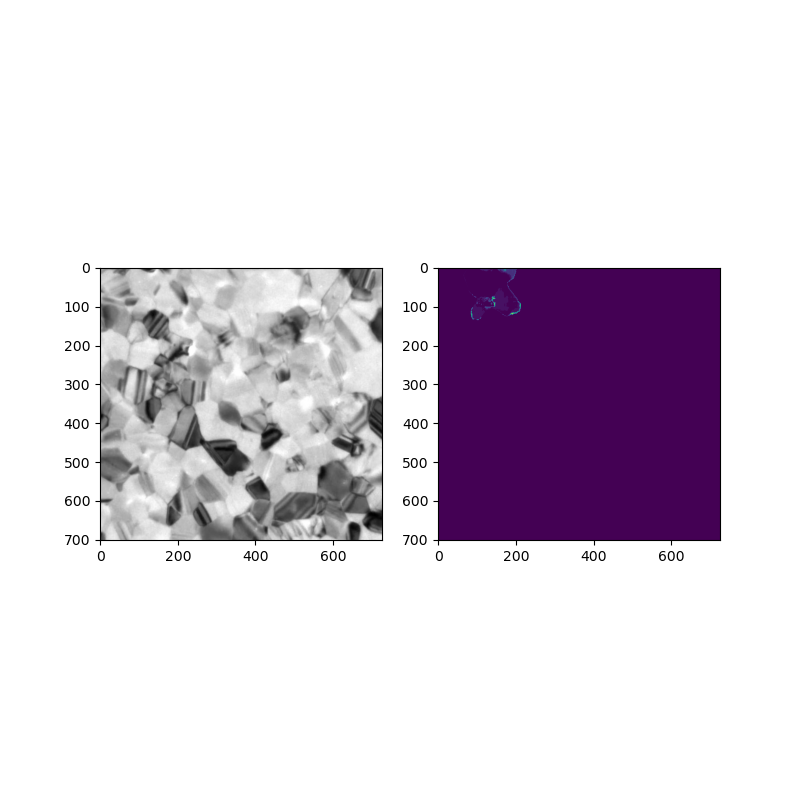

(2, 702, 726)


In [153]:
show_masks_on_image_3(raw_image,mask_3d[idx][10:12])

In [149]:
mask_3d[idx][0:1].shape

(1, 702, 726)

In [150]:
def show_masks_on_image_3(raw_image,masks):
    if len(masks.shape) == 4:
      masks = masks.squeeze()

    fig,axes = plt.subplots(1,2,figsize = (8,8))
    axes[0].imshow(raw_image)
    axes[1].imshow(raw_image)
    print(masks.shape)
    for mask in masks:
        #mask = mask.cpu().detach()
        show_mask(mask,axes[1],True)
    plt.show()

In [138]:
colors[0]

array([0.267004, 0.004874, 0.329415, 1.      ])

In [ ]:
fig = plt.figure(figsize = (10,10))
ax = fig.add_subplot(111,projection = '3d')


for i in range(mask_3d[0].shape[0]):
    
    indices = np.where(mask_3d[0][i,:,:]==1)
    x = indices[0]
    y = indices[1]
    z = np.full_like(x,i)
    
    ax.scatter(x,y,z,c='b',marker='o')
    
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Image index')

plt.show()

In [ ]:
ax = plt.figure().add_subplot(projection = '3d')
ax.voxels(mask_3d[0])

plt.show()

In [89]:
mask_3d[0].shape

(25, 702, 726)

In [255]:
import pandas as pd

In [256]:
column_values = ['x_mean','y_mean','IOU threshold']

In [284]:
df = pd.DataFrame(data = arr[idx],columns = column_values)

In [309]:
df

,x_mean,y_mean,IOU threshold
0,147.736585,493.669919,0.698674
1,158.112026,482.284679,0.655867
2,146.973630,493.562745,0.675774
3,168.275064,480.964653,0.709038
4,167.243953,481.023304,0.688618
5,158.140557,485.016376,0.684511
6,165.885652,480.402403,0.706445
7,164.697622,479.744859,0.686976
8,151.691900,492.359119,0.651892
9,173.701072,479.458545,0.693865


In [84]:
arr[1]

array([[60.17783075, 49.69344458,  0.81054527],
       [58.94380587, 49.34176245,  0.81769311],
       [56.92514239, 48.212639  ,  0.84141666],
       [51.74278846, 42.98106971,  0.79762554],
       [50.750545  , 42.98567424,  0.82803124],
       [50.69706337, 42.83307573,  0.82486647],
       [52.47816728, 43.61685117,  0.82320374],
       [44.61203704, 37.33703704,  0.84199727],
       [58.41564103, 48.9325641 ,  0.80887312],
       [57.0653042 , 48.39135541,  0.81092811],
       [45.33258275, 37.81603243,  0.80740476],
       [52.2721422 , 44.60588416,  0.80806029],
       [44.19043152, 37.02368668,  0.84309453],
       [50.24257044, 42.19529139,  0.83138472],
       [53.31818182, 44.48051948,  0.82125795],
       [50.70997951, 41.92215394,  0.82779628],
       [51.77309302, 43.34180882,  0.88649297],
       [51.81490683, 43.11273292,  0.84385157],
       [55.13890728, 41.82549669,  0.80689013],
       [62.26115407, 47.2230815 ,  0.83667135],
       [53.35064935, 44.37884067,  0.814

In [48]:
len(scores)

1

In [49]:
len(input_points)

1

In [52]:
def show_masks_on_image_2(raw_image,masks):
    if len(masks.shape) == 4:
      masks = masks.squeeze()

    fig,axes = plt.subplots(1,2,figsize = (8,8))
    axes[0].imshow(raw_image)
    axes[1].imshow(raw_image)
    print(masks.shape)
    for mask in masks:
        if torch.is_tensor(mask):
            mask = mask.cpu().detach()
        show_mask(mask,axes[1],True)
    plt.show()

In [53]:
def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)

torch.Size([132, 702, 726])


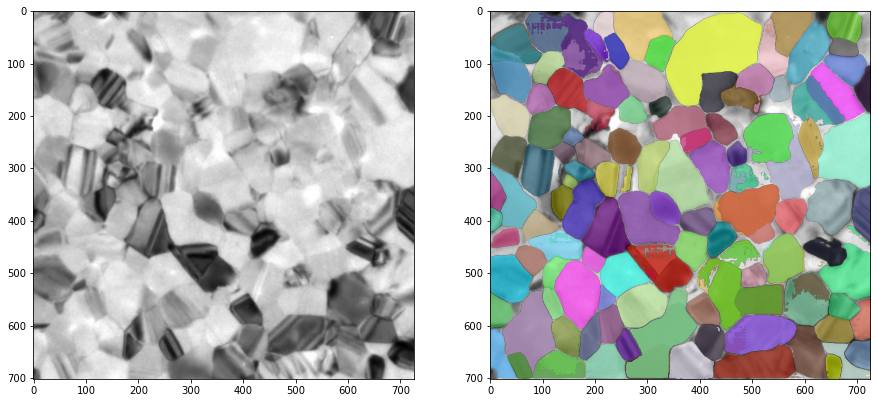

In [62]:
show_masks_on_image_2(raw_image, masks[0])

In [28]:
# try with neighbours that are closer to that paticular grain, how to find negihbours.

iterator = np.zeros((702,726))
result = np.zeros((702,726))


In [29]:
crop_900_pts.shape

(132, 2)

In [30]:
m,n=iterator.shape

In [31]:
m,n

(702, 726)

In [32]:
from collections import deque

In [33]:
val_cent = {}
val_neighbour = {}

In [34]:
# try with neighbours that are closer to that paticular grain, how to find negihbours.

iterator = np.zeros((702,726))

for count,crop in enumerate(crop_900_pts):
    iterator[crop[1],crop[0]] = count+1
que = deque([])
for x in range(702):
    for y in range(726):
        
        if(iterator[x][y]!=0):
            que.append([x,y])
            val_cent[iterator[x][y]] = [x,y]
            val_neighbour[iterator[x][y]] = set()

In [40]:
dirs = [[0,1],[0,-1],[1,0],[-1,0]]

In [36]:
while(len(que)!=0):
    x,y = que.popleft()
    val = iterator[x][y]
    for i,j in dirs:
        k = x+i
        l = y+j
        if(k>=0 and k<m and l>=0 and l<n):
            if(iterator[k][l] == 0):
                iterator[k][l] = val
                que.append([k,l])
            elif(iterator[k][l]!=val):
                if iterator[k][l] not in val_neighbour[val]:
                    val_neighbour[val].add(iterator[k][l])

In [37]:
iterator[36][108]

1.0

In [38]:
val_neighbour

{38.0: {37.0, 39.0},
 12.0: {1.0, 10.0, 11.0, 13.0, 16.0},
 16.0: {12.0, 13.0, 17.0, 32.0},
 1.0: {2.0, 8.0, 9.0, 10.0, 12.0},
 2.0: {1.0, 8.0, 127.0},
 36.0: {32.0, 37.0, 126.0},
 11.0: {10.0, 12.0, 13.0, 14.0, 20.0},
 13.0: {11.0, 12.0, 14.0, 16.0, 17.0},
 32.0: {16.0, 17.0, 31.0, 33.0, 35.0, 36.0, 126.0},
 37.0: {36.0, 38.0, 39.0, 40.0, 42.0, 122.0, 126.0},
 39.0: {37.0, 38.0, 40.0, 41.0},
 17.0: {13.0, 14.0, 16.0, 18.0, 31.0, 32.0},
 10.0: {1.0, 5.0, 9.0, 11.0, 12.0, 20.0},
 127.0: {2.0, 3.0, 8.0},
 126.0: {32.0, 35.0, 36.0, 37.0, 121.0, 122.0},
 14.0: {11.0, 13.0, 15.0, 17.0, 18.0, 20.0},
 8.0: {1.0, 2.0, 3.0, 4.0, 9.0, 127.0},
 9.0: {1.0, 4.0, 5.0, 8.0, 10.0},
 40.0: {37.0, 39.0, 41.0, 42.0},
 35.0: {32.0, 33.0, 34.0, 121.0, 126.0},
 3.0: {4.0, 7.0, 8.0, 127.0},
 31.0: {17.0, 18.0, 22.0, 23.0, 32.0, 33.0},
 15.0: {14.0, 18.0, 19.0, 20.0},
 18.0: {14.0, 15.0, 17.0, 19.0, 22.0, 31.0},
 5.0: {4.0, 6.0, 9.0, 10.0, 20.0, 21.0},
 41.0: {39.0, 40.0, 42.0, 43.0},
 33.0: {23.0, 29.0, 31.0

In [39]:
val_cent

{38.0: [20, 675],
 12.0: [26, 216],
 16.0: [27, 280],
 1.0: [36, 108],
 2.0: [41, 32],
 36.0: [44, 553],
 11.0: [59, 200],
 13.0: [62, 237],
 32.0: [63, 437],
 37.0: [74, 607],
 39.0: [74, 671],
 17.0: [77, 318],
 10.0: [85, 172],
 127.0: [86, 28],
 126.0: [86, 540],
 14.0: [97, 244],
 8.0: [100, 78],
 9.0: [105, 111],
 40.0: [111, 678],
 35.0: [123, 505],
 3.0: [133, 43],
 31.0: [133, 365],
 15.0: [138, 232],
 18.0: [139, 291],
 5.0: [145, 148],
 41.0: [147, 716],
 33.0: [149, 426],
 20.0: [158, 211],
 121.0: [160, 546],
 42.0: [165, 650],
 4.0: [171, 94],
 34.0: [171, 470],
 122.0: [173, 586],
 19.0: [183, 274],
 22.0: [186, 315],
 21.0: [199, 191],
 7.0: [203, 32],
 23.0: [207, 372],
 24.0: [218, 322],
 29.0: [222, 440],
 6.0: [223, 117],
 109.0: [242, 158],
 26.0: [245, 388],
 120.0: [245, 527],
 119.0: [247, 611],
 107.0: [262, 254],
 43.0: [265, 676],
 110.0: [268, 182],
 30.0: [271, 470],
 108.0: [272, 143],
 105.0: [277, 43],
 27.0: [296, 307],
 28.0: [299, 418],
 118.0: [302, 

<IPython.core.display.Javascript object>


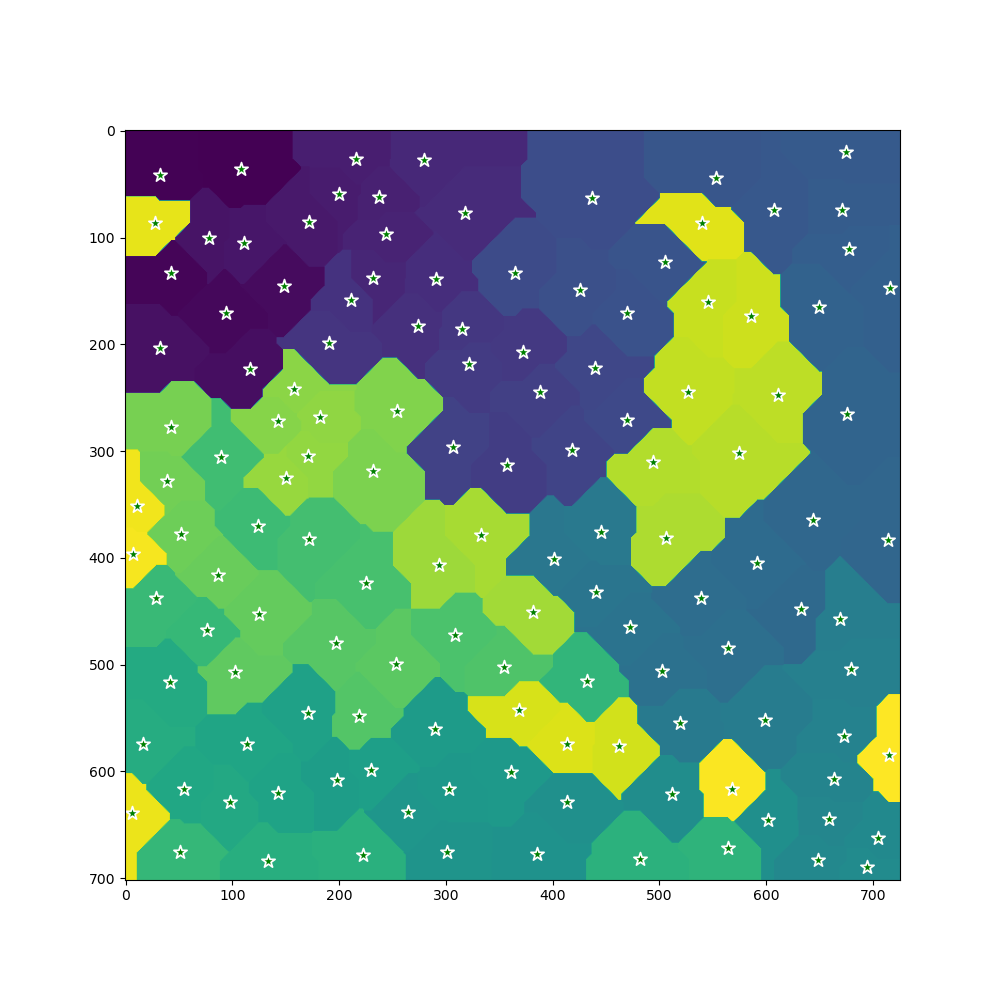

In [40]:
show_points_on_image(iterator,crop_900_pts_img)

In [41]:
input_cents = []
cent_labels = []
for key in val_neighbour.keys():
    lab = [1]
    cent = [val_cent[key]]
    for value in val_neighbour[key]:
        cent.append(val_cent[value])
        lab.append(0)
    input_cents.append(cent)
    cent_labels.append(lab)

In [42]:
input_cents

[[[20, 675], [74, 607], [74, 671]],
 [[26, 216], [36, 108], [85, 172], [59, 200], [62, 237], [27, 280]],
 [[27, 280], [63, 437], [77, 318], [26, 216], [62, 237]],
 [[36, 108], [41, 32], [100, 78], [105, 111], [85, 172], [26, 216]],
 [[41, 32], [100, 78], [36, 108], [86, 28]],
 [[44, 553], [63, 437], [74, 607], [86, 540]],
 [[59, 200], [85, 172], [26, 216], [62, 237], [97, 244], [158, 211]],
 [[62, 237], [59, 200], [26, 216], [97, 244], [27, 280], [77, 318]],
 [[63, 437],
  [149, 426],
  [123, 505],
  [44, 553],
  [27, 280],
  [77, 318],
  [86, 540],
  [133, 365]],
 [[74, 607],
  [44, 553],
  [20, 675],
  [74, 671],
  [111, 678],
  [165, 650],
  [173, 586],
  [86, 540]],
 [[74, 671], [111, 678], [147, 716], [74, 607], [20, 675]],
 [[77, 318],
  [63, 437],
  [62, 237],
  [97, 244],
  [27, 280],
  [139, 291],
  [133, 365]],
 [[85, 172],
  [36, 108],
  [145, 148],
  [105, 111],
  [59, 200],
  [26, 216],
  [158, 211]],
 [[86, 28], [100, 78], [41, 32], [133, 43]],
 [[86, 540],
  [63, 437],
 

In [43]:
cent_labels

[[1, 0, 0],
 [1, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0],
 [1, 0, 0, 0],
 [1, 0, 0, 0],
 [1, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0, 0],
 [1, 0, 0, 0],
 [1, 0, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0],
 [1, 0,

In [53]:
img_path = img_fol+"/cropped750.jpg"
raw_image = Image.open(img_path).convert("RGB").transpose(PIL.Image.TRANSPOSE)
input_points = [[input_cents[36]]]
input_labels = [[cent_labels[36]]]

inputs = processor(raw_image, input_points=input_points,input_labels = input_labels,return_tensors="pt").to(device)
image_embeddings = model.get_image_embeddings(inputs["pixel_values"])

inputs.pop("pixel_values", None)
inputs.update({"image_embeddings": image_embeddings})

with torch.no_grad():
    outputs = model(**inputs,multimask_output=False)

masks = processor.image_processor.post_process_masks(outputs.pred_masks.cpu(), inputs["original_sizes"].cpu(), inputs["reshaped_input_sizes"].cpu())
scores = outputs.iou_scores

In [54]:
masks[0].shape

torch.Size([1, 1, 726, 702])

In [55]:
def show_single_mask_on_image(raw_image,masks):
    if len(masks.shape) == 4:
      masks = masks.squeeze()

    fig,axes = plt.subplots(1,2,figsize = (10,10))
    axes[0].imshow(raw_image)
    axes[1].imshow(raw_image)
    print(masks.shape)
    masks = masks.cpu().detach()
    show_mask(masks,axes[1],True)
    plt.show()

In [77]:
len(input_labels[0])

132

In [81]:
raw_image = Image.open('crop_image/cropped750.jpg').convert('RGB').transpose(PIL.Image.TRANSPOSE)

In [44]:
def show_points_on_image(raw_image, input_points, input_labels=None):
    plt.figure(figsize=(10,10))
    plt.imshow(raw_image)
    input_points = np.array(input_points)
    if input_labels is None:
      labels = np.ones_like(input_points[:, 0])
    else:
      labels = np.array(input_labels)
    show_points(input_points, labels, plt.gca())
    plt.axis('on')
    plt.show()
    
def show_single_mask_on_image(raw_image,masks):
    if len(masks.shape) == 4:
      masks = masks.squeeze()

    fig,axes = plt.subplots(1,2,figsize = (10,10))
    axes[0].imshow(raw_image)
    axes[1].imshow(raw_image)
    print(masks.shape)
    masks = masks.cpu().detach()
    show_mask(masks,axes[1],True)
    plt.show()

In [45]:
def show_points_singleMask_image(raw_image,masks,input_points,input_labels = None):
    
    if len(masks.shape) == 4:
        masks = masks.squeeze()
    fig,axes = plt.subplots(1,2,figsize = (10,10))
    axes[0].imshow(raw_image)
    input_points = np.array(input_points)
    
    if input_labels is None:
      labels = np.ones_like(input_points[:, 0])
    else:
      labels = np.array(input_labels)
    
    show_points(input_points, labels, axes[0])
    #axes[0].axis('on')
    axes[1].imshow(raw_image)
    #print(masks.shape)
    masks = masks.cpu().detach()
    show_mask(masks,axes[1],True)
    #axes[1].axis['on']
    plt.show()
    
    
    

<IPython.core.display.Javascript object>


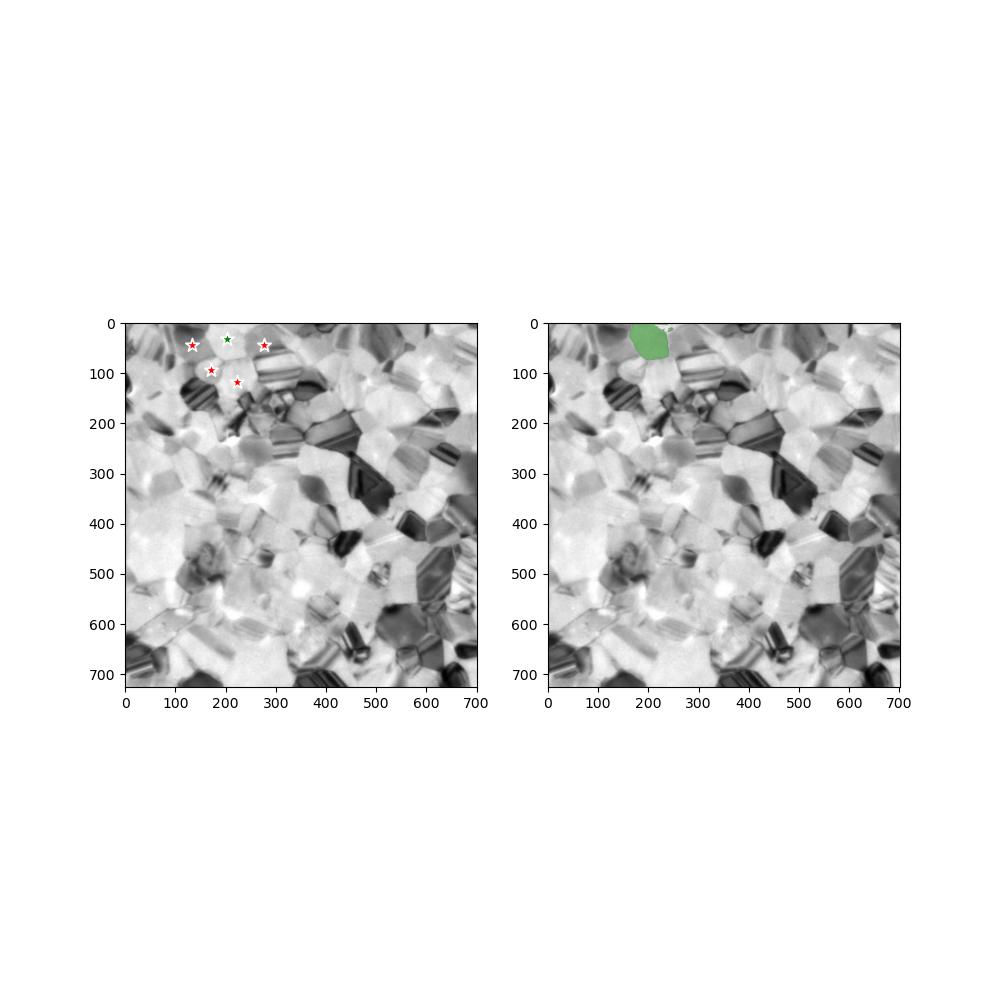

In [57]:
show_points_singleMask_image(raw_image,masks[0],input_cents[36],cent_labels[36])

In [154]:
## for Mode filter

In [156]:
mask_3d.shape

(132, 25, 702, 726)

In [167]:
gg_mask = mask_3d[36]

In [158]:
gg_mask.shape

(25, 702, 726)

In [171]:
from scipy import stats

In [173]:
gg_mask_mode = stats.mode(gg_mask,axis = 0)

In [181]:
gg_mask_mode[1].shape

(1, 702, 726)

<IPython.core.display.Javascript object>


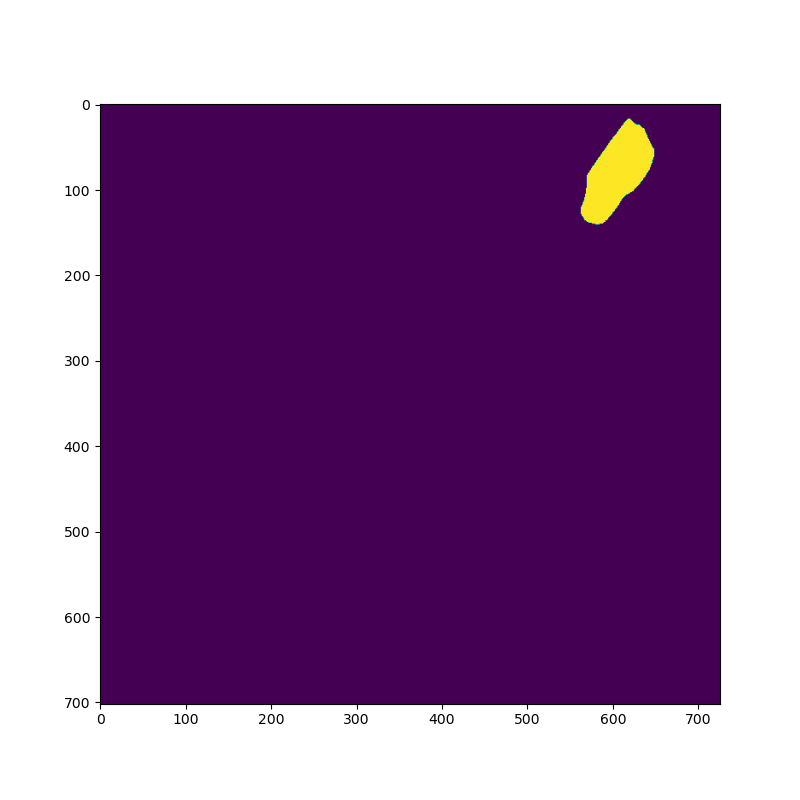

In [182]:
fig = plt.figure(figsize=(8,8))
plt.imshow(gg_mask_mode[0][0])
plt.show()

In [183]:
mask_3d.shape

(132, 25, 702, 726)

In [186]:
masks_mode = np.zeros_like(mask_3d[:,0:1,:,:])

In [187]:
masks_mode.shape

(132, 1, 702, 726)

In [189]:
for i,gg_mask in enumerate(mask_3d):
    masks_mode[i] = stats.mode(gg_mask,axis = 0)[0]
    print(i)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131


<IPython.core.display.Javascript object>


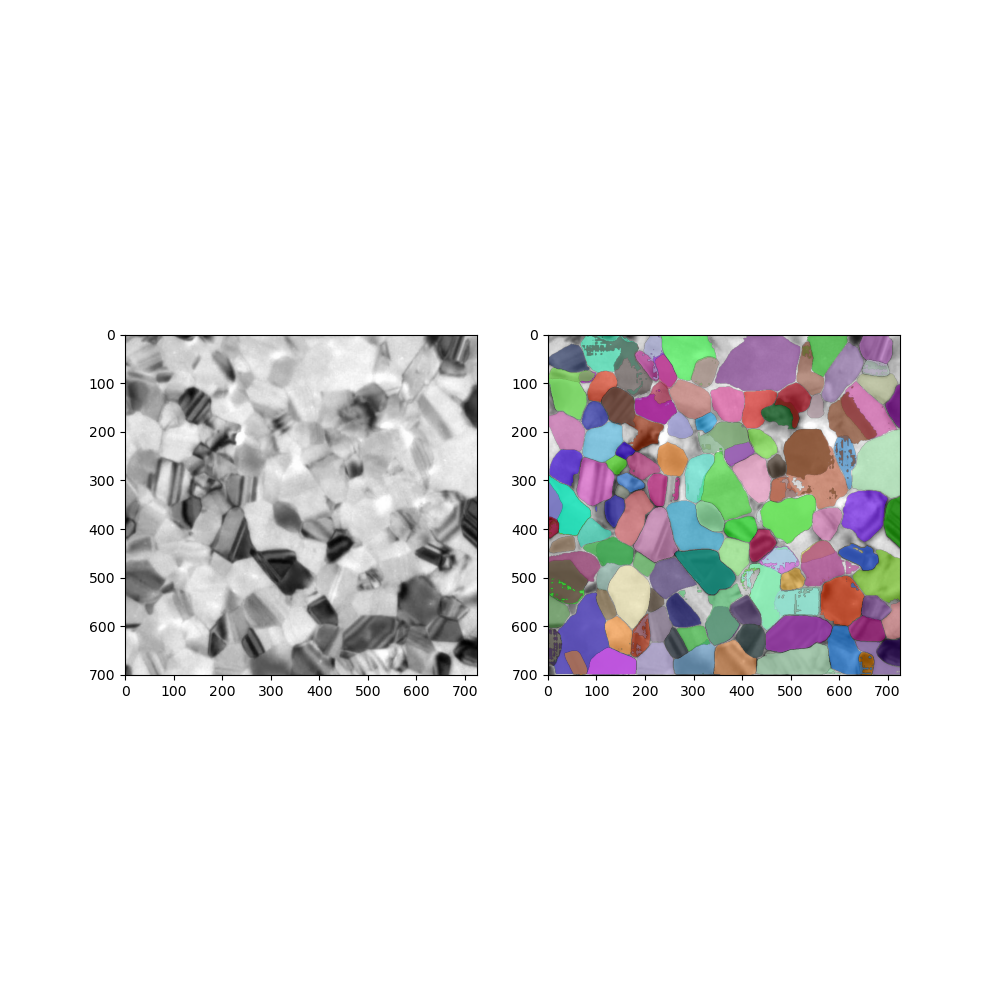

(132, 702, 726)


In [193]:
show_masks_on_image_2(raw_image,masks_mode)

In [196]:
input_cents

[[[20, 675], [74, 607], [74, 671]],
 [[26, 216], [36, 108], [85, 172], [59, 200], [62, 237], [27, 280]],
 [[27, 280], [63, 437], [77, 318], [26, 216], [62, 237]],
 [[36, 108], [41, 32], [100, 78], [105, 111], [85, 172], [26, 216]],
 [[41, 32], [100, 78], [36, 108], [86, 28]],
 [[44, 553], [63, 437], [74, 607], [86, 540]],
 [[59, 200], [85, 172], [26, 216], [62, 237], [97, 244], [158, 211]],
 [[62, 237], [59, 200], [26, 216], [97, 244], [27, 280], [77, 318]],
 [[63, 437],
  [149, 426],
  [123, 505],
  [44, 553],
  [27, 280],
  [77, 318],
  [86, 540],
  [133, 365]],
 [[74, 607],
  [44, 553],
  [20, 675],
  [74, 671],
  [111, 678],
  [165, 650],
  [173, 586],
  [86, 540]],
 [[74, 671], [111, 678], [147, 716], [74, 607], [20, 675]],
 [[77, 318],
  [63, 437],
  [62, 237],
  [97, 244],
  [27, 280],
  [139, 291],
  [133, 365]],
 [[85, 172],
  [36, 108],
  [145, 148],
  [105, 111],
  [59, 200],
  [26, 216],
  [158, 211]],
 [[86, 28], [100, 78], [41, 32], [133, 43]],
 [[86, 540],
  [63, 437],
 

In [197]:
cent_labels

[[1, 0, 0],
 [1, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0],
 [1, 0, 0, 0],
 [1, 0, 0, 0],
 [1, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0, 0],
 [1, 0, 0, 0],
 [1, 0, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0],
 [1, 0,

In [46]:
from tqdm import tqdm

In [47]:
# trying centroid based method
# after that applying the mode filter


mask_3d_neg = np.zeros((132,25,726,702))

for i,fil_name in tqdm(enumerate(gg1)):
    
    img_path = img_fol+"/"+fil_name
    raw_image = Image.open(img_path).convert("RGB").transpose(PIL.Image.TRANSPOSE)
    
    
    
    for j,pts,labels in zip([k for k in range(len(input_cents))],input_cents,cent_labels):
        
        input_points = [[pts]]
        input_labels = [[labels]]

        inputs = processor(raw_image, input_points=input_points,input_labels = input_labels,return_tensors="pt").to(device)
        image_embeddings = model.get_image_embeddings(inputs["pixel_values"])

        inputs.pop("pixel_values", None)
        inputs.update({"image_embeddings": image_embeddings})

        with torch.no_grad():
            outputs = model(**inputs,multimask_output=False)

        masks = processor.image_processor.post_process_masks(outputs.pred_masks.cpu(), inputs["original_sizes"].cpu(), inputs["reshaped_input_sizes"].cpu())
        mask_3d_neg[j,i,:] = np.squeeze(masks[0].cpu().detach().numpy())

0it [00:00, ?it/s]/usr/local/anaconda3/lib/python3.8/site-packages/torch/nn/functional.py:3609: UserWarning: Default upsampling behavior when mode=linear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn(
25it [42:19, 101.57s/it]


In [203]:
img_path

'/home/UFAD/s.kapoor/GrainGrowth/skapoor/tem_data/crop_image/cropped774.jpg'

<IPython.core.display.Javascript object>


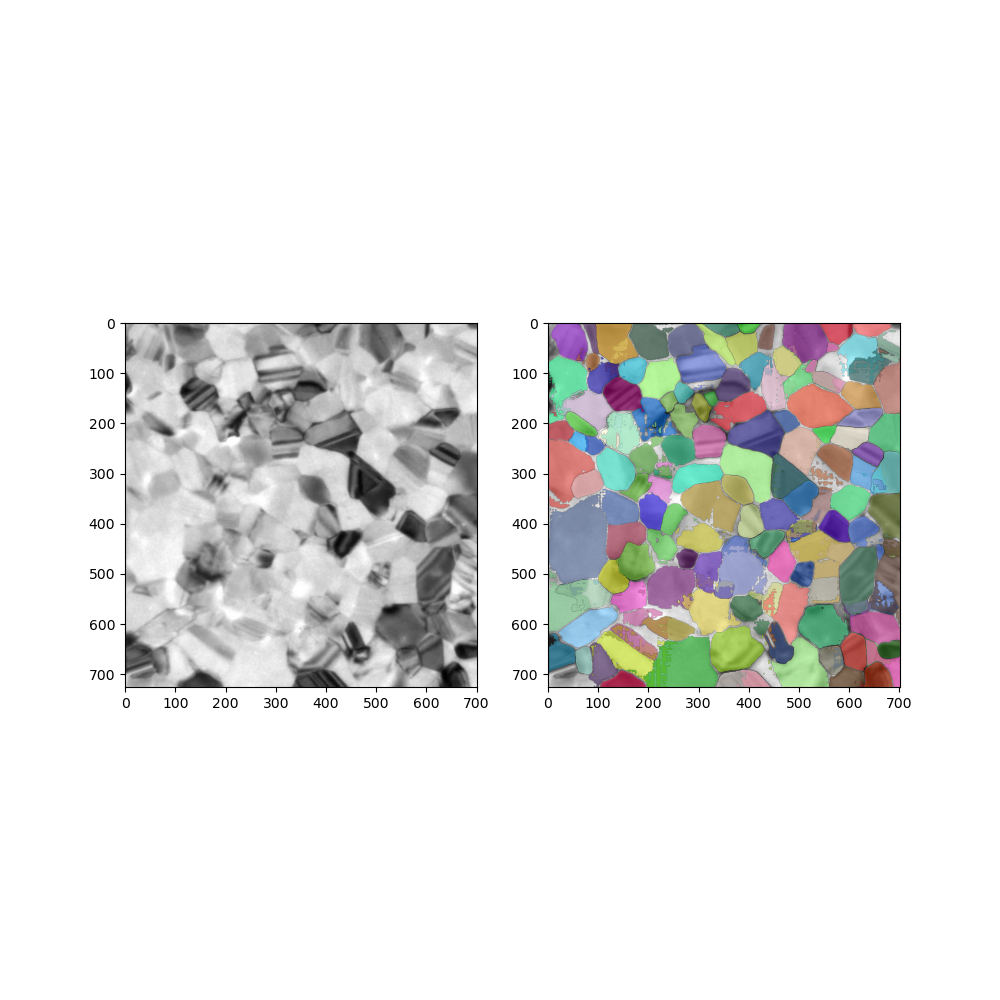

(132, 726, 702)


In [48]:
show_masks_on_image_2(raw_image,mask_3d_neg[:,24,:,:])

<IPython.core.display.Javascript object>


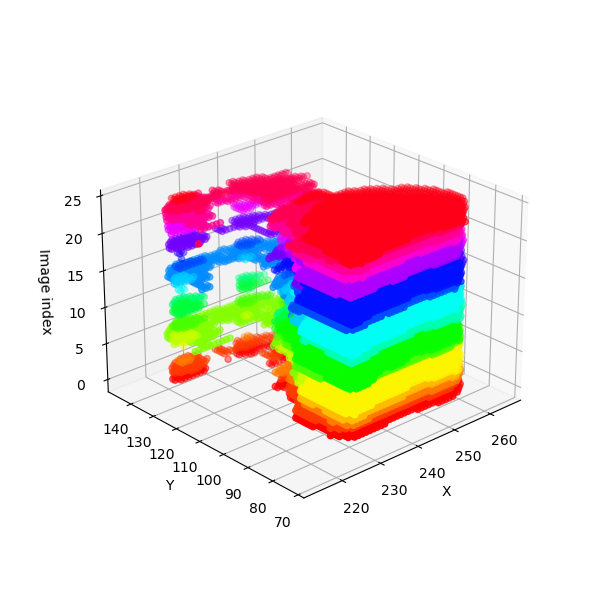

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

In [126]:
fig = plt.figure(figsize = (6,6))
ax = fig.add_subplot(111,projection = '3d')

idx = 15

colors = plt.cm.hsv(np.linspace(0,1,mask_3d_neg[idx].shape[0]))

for i in range(mask_3d_neg[idx].shape[0]):
    
    indices = np.where(mask_3d_neg[idx][i,:,:]==1)
    x = indices[0]
    y = indices[1]
    z = np.full_like(x,i)
    
    color = colors[i]
    
    ax.scatter(x,y,z,c=color,marker='o')
    
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Image index')

ax.mouse_init()

plt.show()

In [209]:
masks_mode_neg = np.zeros_like(mask_3d_neg[:,0:1,:,:])
for i,gg_mask in tqdm(enumerate(mask_3d_neg)):
    masks_mode_neg[i] = stats.mode(gg_mask,axis = 0)[0]

132it [19:57,  9.07s/it]


In [210]:
img_path = img_fol+"/"+gg1[0]
raw_image = Image.open(img_path).convert("RGB").transpose(PIL.Image.TRANSPOSE)

<IPython.core.display.Javascript object>


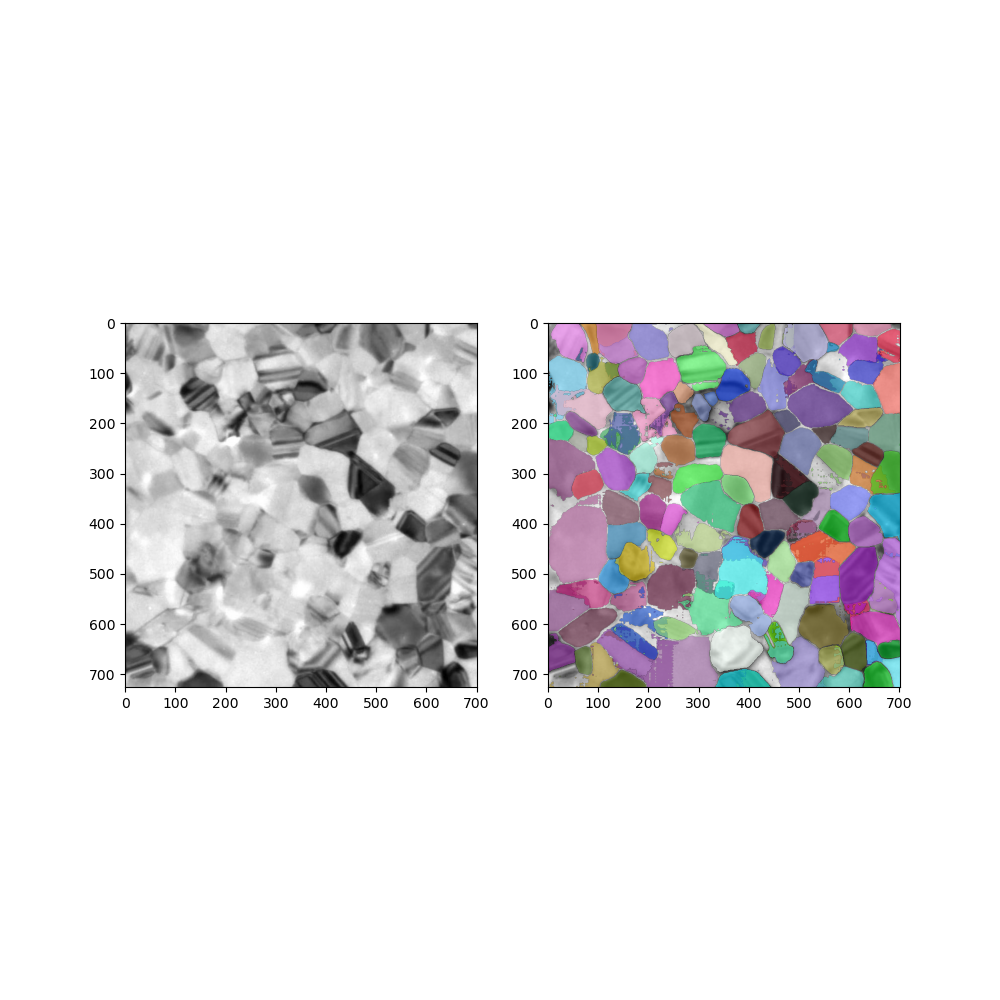

(132, 726, 702)


In [211]:
show_masks_on_image_2(raw_image,masks_mode_neg)

In [35]:
def get_centroid(bin_img):
    
    m00 = np.sum(bin_img)
    m10 = np.sum(np.arange(bin_img.shape[0])[:,np.newaxis]* bin_img)
    m01 = np.sum(np.arange(bin_img.shape[1])[np.newaxis,:]*bin_img)
    
    cent_y = int(m10/m00)
    cent_x = int(m01/m00)
    
    return cent_y,cent_x

In [179]:
gg_mask = mask_3d_neg[12][13]

In [180]:
gg_mask.shape

(726, 702)

In [181]:
gg_mask_y,gg_mask_x = get_centroid(gg_mask)

In [182]:
gg_mask_y,gg_mask_x

(166, 71)

<IPython.core.display.Javascript object>


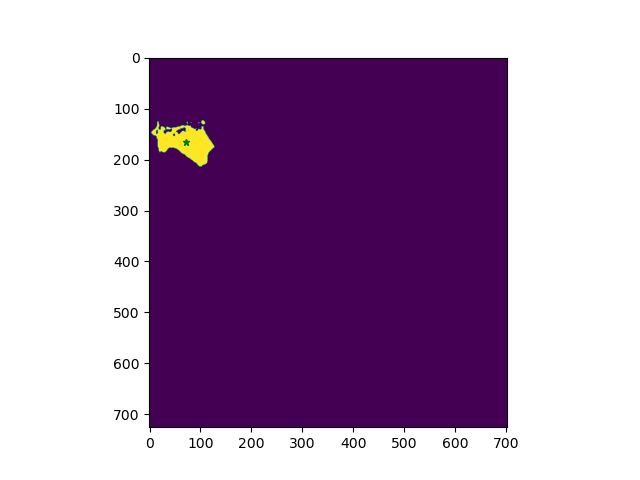

In [183]:
fig = plt.figure()
plt.plot(gg_mask_x,gg_mask_y,marker = '*',markersize = 5,color = 'green')
plt.imshow(gg_mask)

In [184]:
gg_mask_closed = np.zeros_like(gg_mask)

In [185]:
que_mask = deque([])
que_mask.append([gg_mask_y,gg_mask_x])

In [186]:
gg_mask_closed[gg_mask_y,gg_mask_x] = gg_mask[gg_mask_y,gg_mask_x]

In [187]:
m,n = gg_mask.shape

In [188]:
m,n

(726, 702)

In [189]:
print(len(que_mask))

1


In [190]:
np.sum(gg_mask)

5634.0

In [191]:
np.sum(gg_mask_closed)

1.0

In [192]:
while(len(que_mask)!=0):
    #print(len(que_mask))
    y,x = que_mask.popleft()
    #print(y,x)
    #gg_mask_closed[y][x] = gg_mask[y][x]
    for i,j in dirs:
        k = y+i
        l = x+j
        if(k>=0 and k<m and l>=0 and l<n and gg_mask[k][l] == 1 and gg_mask_closed[k][l] == 0):
            gg_mask_closed[k][l] = gg_mask[k][l]
            #print(k,l)
            que_mask.append([k,l])

In [177]:
gg_mask_closed = get_mask_closed(mask_3d_neg[12][13])

<IPython.core.display.Javascript object>


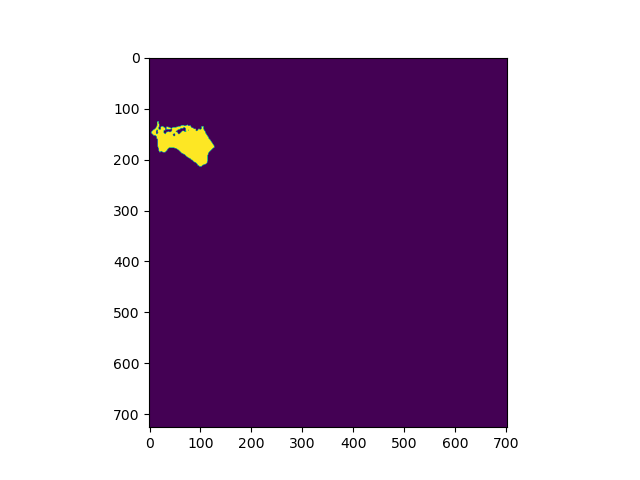

In [193]:
fig = plt.figure()
plt.imshow(gg_mask_closed)


In [33]:
def get_mask_closed(gg_mask):
    
    
    
    gg_mask_y,gg_mask_x = get_centroid(gg_mask)
    gg_mask_closed = np.zeros_like(gg_mask)
    gg_mask_closed[gg_mask_y,gg_mask_x] = gg_mask[gg_mask_y,gg_mask_x]
    m,n = gg_mask.shape
    
    que_mask = deque([])
    que_mask.append([gg_mask_y,gg_mask_x])
    
    while(len(que_mask)!=0):
    #print(len(que_mask))
        y,x = que_mask.popleft()
    #print(y,x)
    #gg_mask_closed[y][x] = gg_mask[y][x]
        for i,j in dirs:
            k = y+i
            l = x+j
            if(k>=0 and k<m and l>=0 and l<n and gg_mask[k][l] == 1 and gg_mask_closed[k][l] == 0):
                gg_mask_closed[k][l] = gg_mask[k][l]
                #print(k,l)
                que_mask.append([k,l])
    
    return gg_mask_closed

In [195]:
gg_closed_mask = get_mask_closed(gg_mask)

<IPython.core.display.Javascript object>


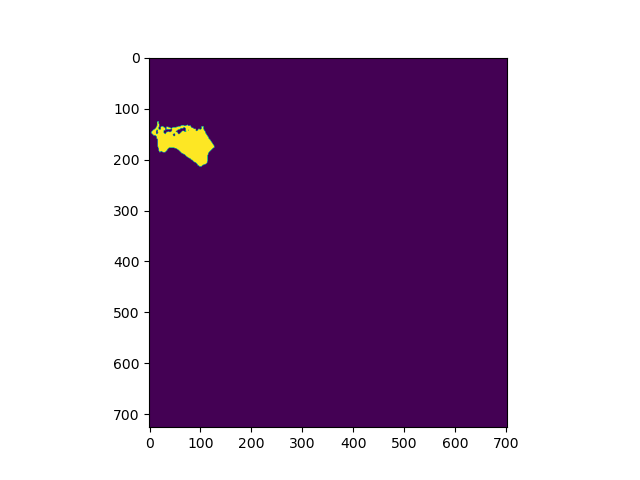

In [196]:
fig = plt.figure()
plt.imshow(gg_mask_closed)

In [146]:
mask_3d_neg.shape

(132, 25, 726, 702)

<IPython.core.display.Javascript object>


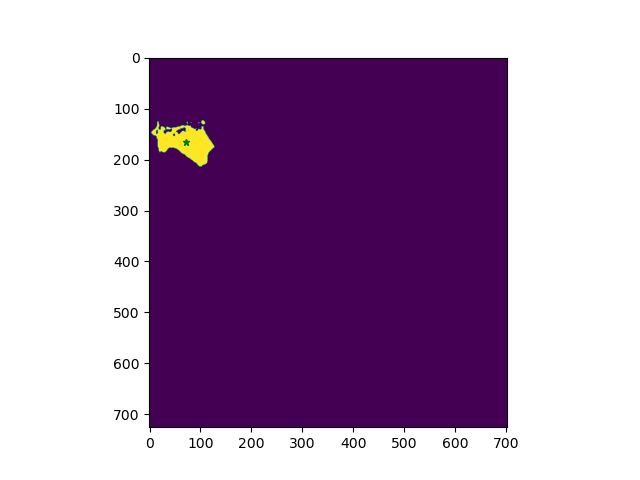

In [197]:
fig = plt.figure()
gg_mask_y,gg_mask_x = get_centroid(mask_3d_neg[12][13])
plt.plot(gg_mask_x,gg_mask_y,marker = '*',markersize = 5,color = 'green')
plt.imshow(mask_3d_neg[12][13])

<IPython.core.display.Javascript object>


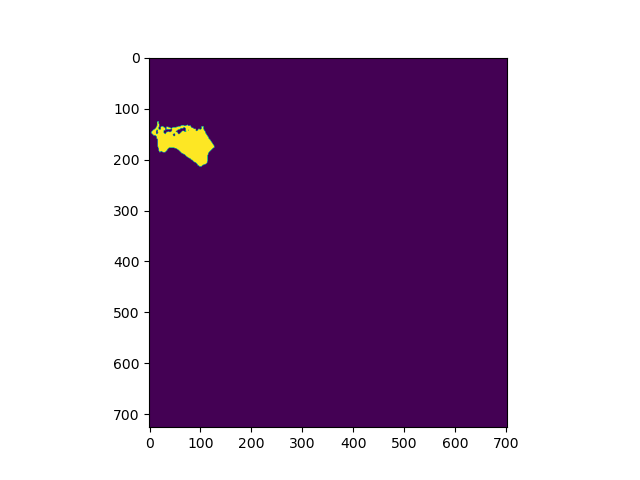

In [198]:
fig = plt.figure()
plt.imshow(get_mask_closed(mask_3d_neg[12][13]))

In [200]:
## getting all mask closed
a,b,_,_ = mask_3d_neg.shape
mask_3d_neg_closed = np.zeros_like(mask_3d_neg)
for i in tqdm(range(a)):
    for j in range(b):
        mask_3d_neg_closed[i][j] = get_mask_closed(mask_3d_neg[i][j])

100%|██████████| 132/132 [01:09<00:00,  1.89it/s]


<IPython.core.display.Javascript object>


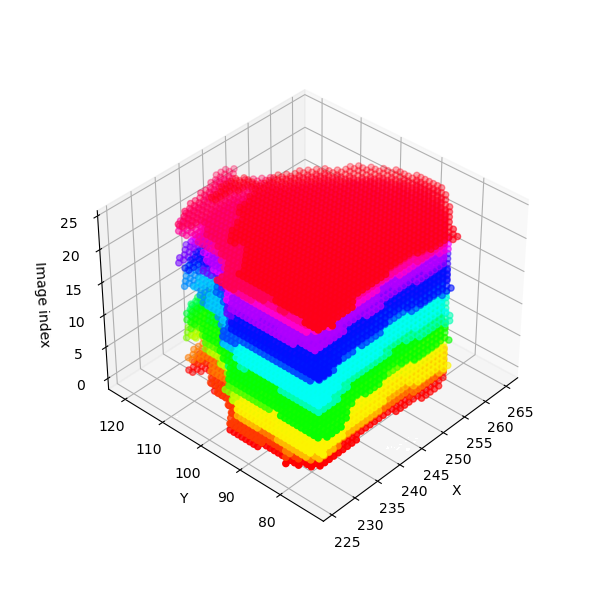

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

In [201]:
fig = plt.figure(figsize = (6,6))
ax = fig.add_subplot(111,projection = '3d')

idx = 15

colors = plt.cm.hsv(np.linspace(0,1,mask_3d_neg_closed[idx].shape[0]))

for i in range(mask_3d_neg_closed[idx].shape[0]):
    
    indices = np.where(mask_3d_neg_closed[idx][i,:,:]==1)
    x = indices[0]
    y = indices[1]
    z = np.full_like(x,i)
    
    color = colors[i]
    
    ax.scatter(x,y,z,c=color,marker='o')
    
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Image index')

ax.mouse_init()

plt.show()

In [203]:
from scipy import stats

In [204]:
## getting mode of above masks
masks_mode_closed_neg = np.zeros_like(mask_3d_neg_closed[:,0:1,:,:])
for i,gg_mask in tqdm(enumerate(mask_3d_neg_closed)):
    masks_mode_closed_neg[i] = stats.mode(gg_mask,axis = 0)[0]

132it [20:51,  9.48s/it]


<IPython.core.display.Javascript object>


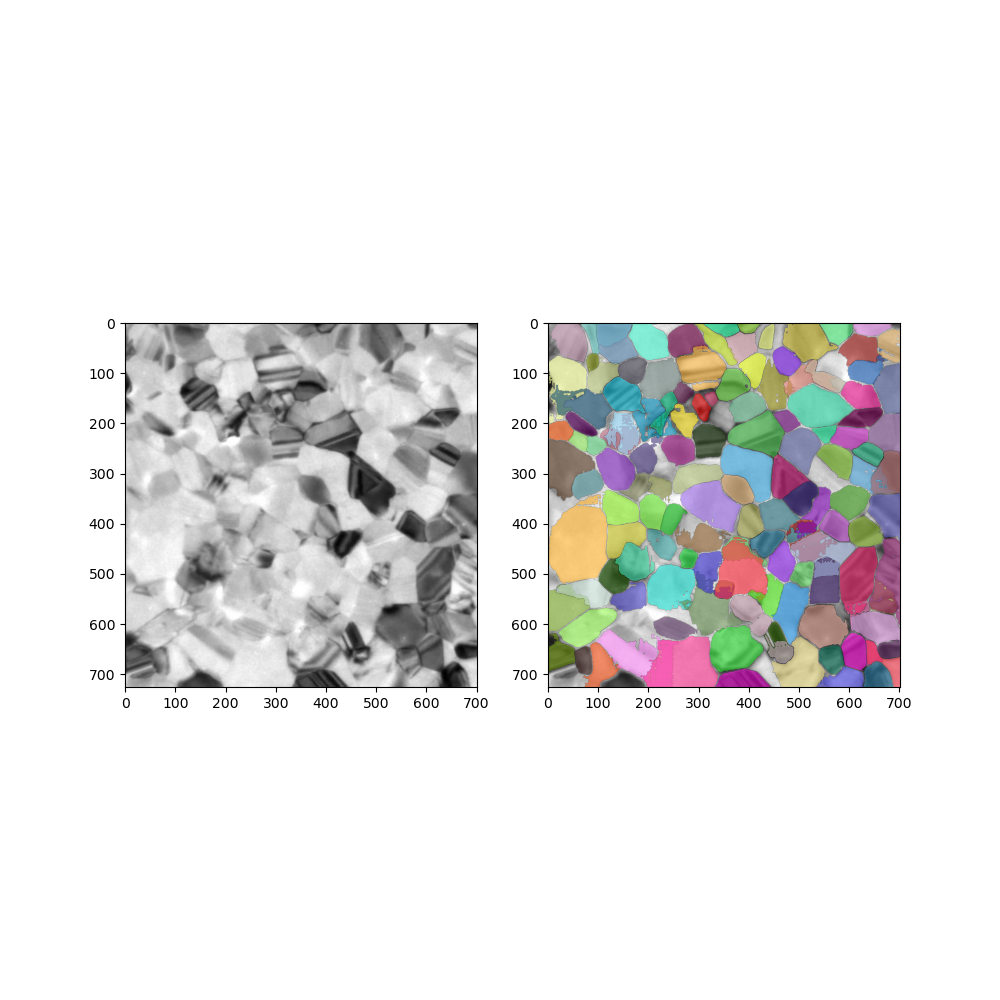

(132, 726, 702)


In [205]:
show_masks_on_image_2(raw_image,masks_mode_closed_neg)

<IPython.core.display.Javascript object>


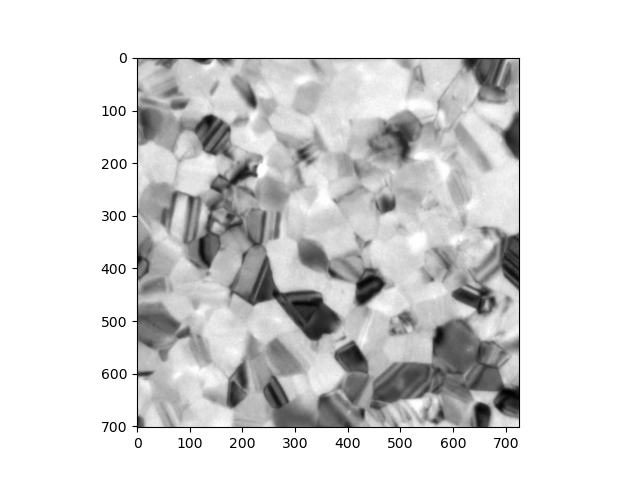

In [214]:
img_path = img_fol+"/"+fil_name
raw_image = Image.open(img_path).convert("RGB").transpose(PIL.Image.TRANSPOSE)

fig = plt.figure()
plt.imshow(raw_image)

<IPython.core.display.Javascript object>


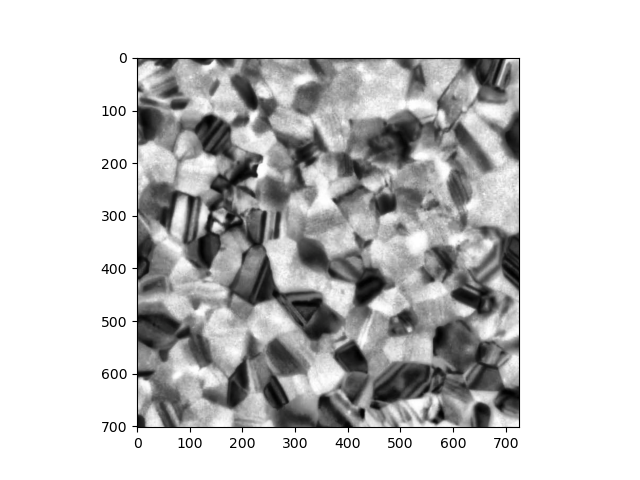

In [206]:
bgr = cv2.imread(img_path)

lab = cv2.cvtColor(bgr, cv2.COLOR_BGR2LAB)

lab_planes = cv2.split(lab)

clahe = cv2.createCLAHE(clipLimit = 3,tileGridSize = (8,8))

lab_planes[0] = clahe.apply(lab_planes[0])

lab = cv2.merge(lab_planes)

bgr = cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)

fig = plt.figure()
plt.imshow(bgr)

<IPython.core.display.Javascript object>


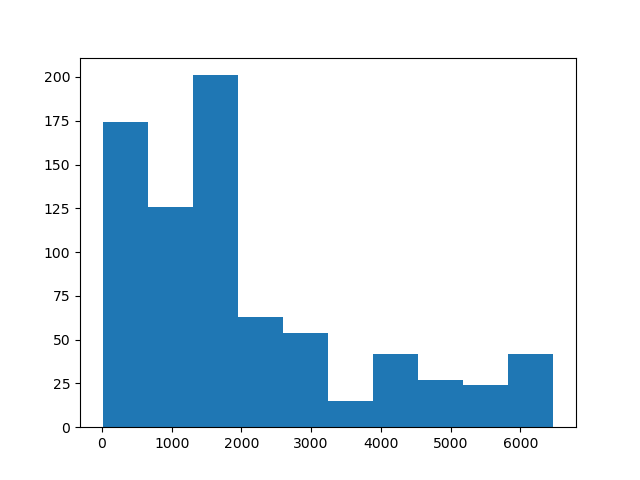

(array([174., 126., 201.,  63.,  54.,  15.,  42.,  27.,  24.,  42.]),
 array([   8. ,  654.7, 1301.4, 1948.1, 2594.8, 3241.5, 3888.2, 4534.9,
        5181.6, 5828.3, 6475. ]),
 <BarContainer object of 10 artists>)

In [238]:
plt.figure()
plt.hist(raw_image.histogram())

In [241]:
#applying histogram equalization
# trying centroid based method
# after that applying the mode filter


mask_3d_neg = np.zeros((132,25,726,702))

for i,fil_name in tqdm(enumerate(gg1)):
    
    img_path = img_fol+"/"+fil_name
    #raw_image = Image.open(img_path).convert("RGB").transpose(PIL.Image.TRANSPOSE)
    bgr = cv2.imread(img_path)

    lab = cv2.cvtColor(bgr, cv2.COLOR_BGR2LAB)

    lab_planes = cv2.split(lab)

    clahe = cv2.createCLAHE(clipLimit = 3,tileGridSize = (8,8))

    lab_planes[0] = clahe.apply(lab_planes[0])

    lab = cv2.merge(lab_planes)

    bgr = cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)
    
    raw_image = cv2.transpose(bgr)
    
    
    
    for j,pts,labels in zip([k for k in range(len(input_cents))],input_cents,cent_labels):
        
        input_points = [[pts]]
        input_labels = [[labels]]

        inputs = processor(raw_image, input_points=input_points,input_labels = input_labels,return_tensors="pt").to(device)
        image_embeddings = model.get_image_embeddings(inputs["pixel_values"])

        inputs.pop("pixel_values", None)
        inputs.update({"image_embeddings": image_embeddings})

        with torch.no_grad():
            outputs = model(**inputs,multimask_output=False)

        masks = processor.image_processor.post_process_masks(outputs.pred_masks.cpu(), inputs["original_sizes"].cpu(), inputs["reshaped_input_sizes"].cpu())
        mask_3d_neg[j,i,:] = np.squeeze(masks[0].cpu().detach().numpy())

25it [55:10, 132.40s/it]


<IPython.core.display.Javascript object>


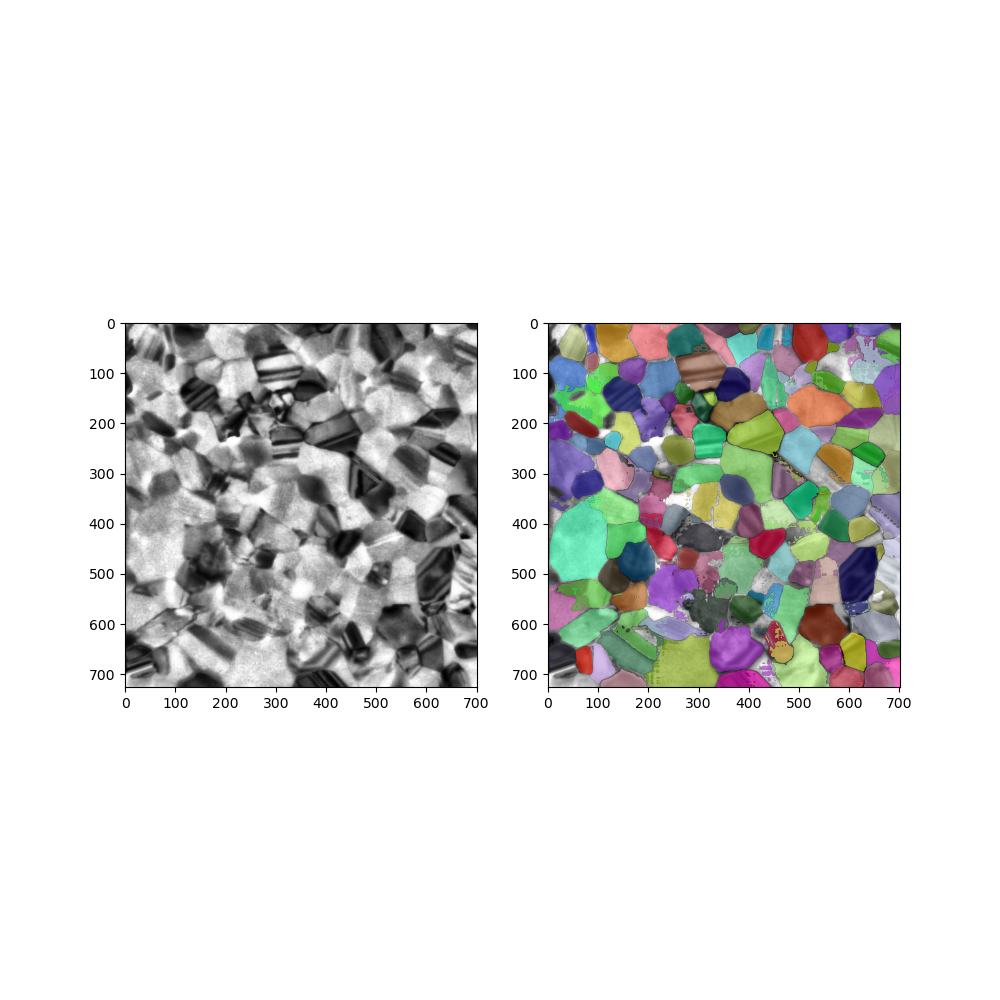

(132, 726, 702)


In [242]:
show_masks_on_image_2(raw_image,mask_3d_neg[:,24,:,:])

In [243]:
masks_mode_neg = np.zeros_like(mask_3d_neg[:,0:1,:,:])
for i,gg_mask in tqdm(enumerate(mask_3d_neg)):
    masks_mode_neg[i] = stats.mode(gg_mask,axis = 0)[0]

132it [49:59, 22.72s/it]


<IPython.core.display.Javascript object>


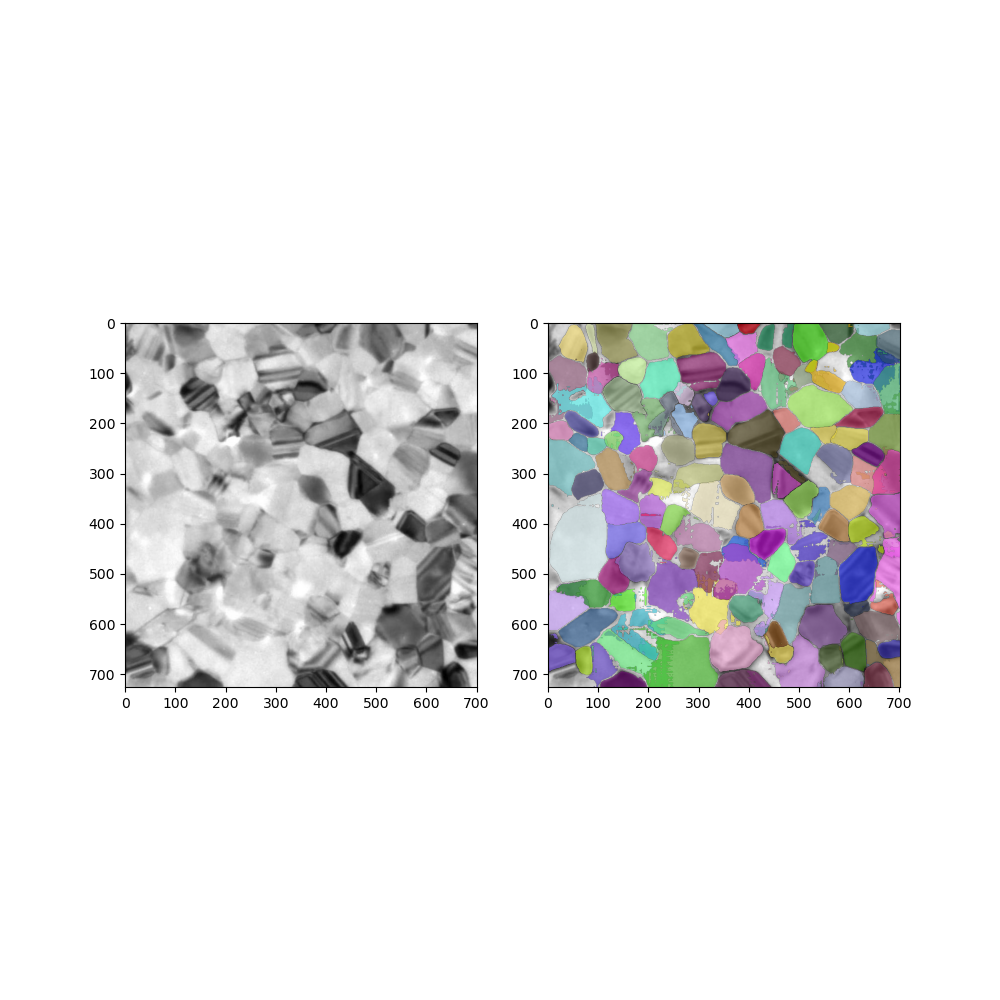

(132, 726, 702)


In [244]:
img_path = img_fol+"/"+gg1[0]
raw_image = Image.open(img_path).convert("RGB").transpose(PIL.Image.TRANSPOSE)
show_masks_on_image_2(raw_image,masks_mode_neg)

In [210]:
img_path = img_fol+"/cropped750.jpg"
raw_image = bgr
input_points = [crop_900_pts_token]
#input_labels = [labels]

inputs = processor(raw_image, input_points=input_points,return_tensors="pt").to(device)
image_embeddings = model.get_image_embeddings(inputs["pixel_values"])

inputs.pop("pixel_values", None)
inputs.update({"image_embeddings": image_embeddings})

with torch.no_grad():
    outputs = model(**inputs,multimask_output=False)

masks = processor.image_processor.post_process_masks(outputs.pred_masks.cpu(), inputs["original_sizes"].cpu(), inputs["reshaped_input_sizes"].cpu())
scores = outputs.iou_scores

/usr/local/anaconda3/lib/python3.8/site-packages/torch/nn/functional.py:3609: UserWarning: Default upsampling behavior when mode=linear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn(


<IPython.core.display.Javascript object>


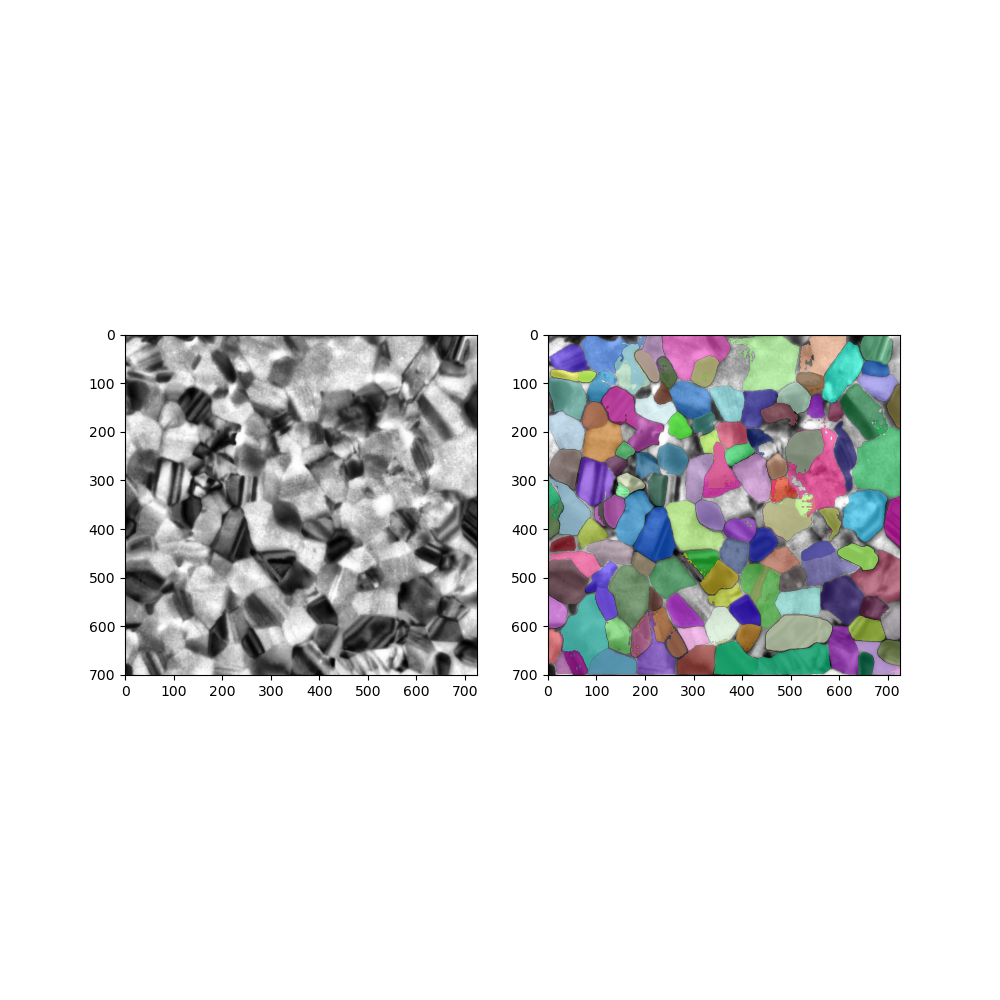

torch.Size([132, 702, 726])


In [211]:
show_masks_on_image_2(raw_image,masks[0])

In [215]:
# trying centroid based method
# after that applying the mode filter


mask_3d_w1 = np.zeros((132,25,726,702))

for i,fil_name in tqdm(enumerate(gg1)):
    
    img_path = img_fol+"/"+fil_name
    
    bgr = cv2.imread(img_path)

    lab = cv2.cvtColor(bgr, cv2.COLOR_BGR2LAB)

    lab_planes = cv2.split(lab)

    clahe = cv2.createCLAHE(clipLimit = 3,tileGridSize = (8,8))

    lab_planes[0] = clahe.apply(lab_planes[0])

    lab = cv2.merge(lab_planes)

    bgr = cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)
    
    raw_image = cv2.transpose(bgr)
    
    input_points = [crop_900_pts_token]

    inputs = processor(raw_image, input_points=input_points,return_tensors="pt").to(device)
    image_embeddings = model.get_image_embeddings(inputs["pixel_values"])

    inputs.pop("pixel_values", None)
    inputs.update({"image_embeddings": image_embeddings})

    with torch.no_grad():
        outputs = model(**inputs,multimask_output=False)

    masks = processor.image_processor.post_process_masks(outputs.pred_masks.cpu(), inputs["original_sizes"].cpu(), inputs["reshaped_input_sizes"].cpu())
    print(masks[0].shape)
    #break
    mask_3d_w1[0:132,i,:] = np.squeeze(masks[0].cpu().detach().numpy())

0it [00:00, ?it/s]

torch.Size([132, 1, 726, 702])


1it [00:01,  1.51s/it]

torch.Size([132, 1, 726, 702])


2it [00:03,  1.50s/it]

torch.Size([132, 1, 726, 702])


3it [00:04,  1.50s/it]

torch.Size([132, 1, 726, 702])


4it [00:05,  1.50s/it]

torch.Size([132, 1, 726, 702])


5it [00:07,  1.50s/it]

torch.Size([132, 1, 726, 702])


6it [00:08,  1.50s/it]

torch.Size([132, 1, 726, 702])


7it [00:10,  1.48s/it]

torch.Size([132, 1, 726, 702])


8it [00:11,  1.49s/it]

torch.Size([132, 1, 726, 702])


9it [00:13,  1.49s/it]

torch.Size([132, 1, 726, 702])


10it [00:14,  1.49s/it]

torch.Size([132, 1, 726, 702])


11it [00:16,  1.47s/it]

torch.Size([132, 1, 726, 702])


12it [00:17,  1.47s/it]

torch.Size([132, 1, 726, 702])


13it [00:19,  1.48s/it]

torch.Size([132, 1, 726, 702])


14it [00:20,  1.47s/it]

torch.Size([132, 1, 726, 702])


15it [00:22,  1.48s/it]

torch.Size([132, 1, 726, 702])


16it [00:23,  1.47s/it]

torch.Size([132, 1, 726, 702])


17it [00:25,  1.47s/it]

torch.Size([132, 1, 726, 702])


18it [00:26,  1.49s/it]

torch.Size([132, 1, 726, 702])


19it [00:28,  1.52s/it]

torch.Size([132, 1, 726, 702])


20it [00:29,  1.54s/it]

torch.Size([132, 1, 726, 702])


21it [00:31,  1.55s/it]

torch.Size([132, 1, 726, 702])


22it [00:33,  1.56s/it]

torch.Size([132, 1, 726, 702])


23it [00:34,  1.57s/it]

torch.Size([132, 1, 726, 702])


24it [00:36,  1.57s/it]

torch.Size([132, 1, 726, 702])


25it [00:37,  1.51s/it]


In [216]:
mask_3d_w1.shape

(132, 25, 726, 702)

In [217]:
masks_mode_w1 = np.zeros_like(mask_3d_w1[:,0:1,:,:])
for i,gg_mask in tqdm(enumerate(mask_3d_w1)):
    masks_mode_w1[i] = stats.mode(gg_mask,axis = 0)[0]

132it [20:34,  9.35s/it]


<IPython.core.display.Javascript object>


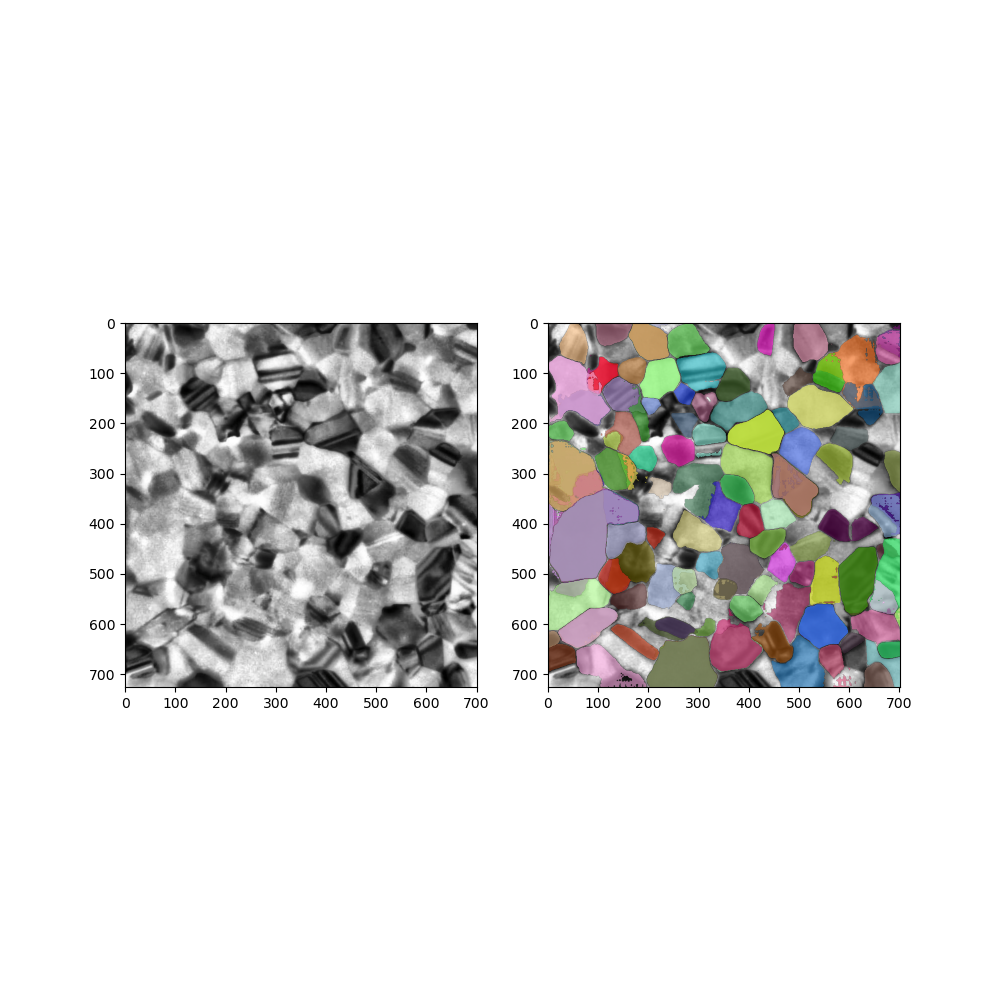

(132, 726, 702)


In [221]:
show_masks_on_image_2(raw_image,masks_mode_w1)

In [219]:
## getting all mask closed
a,b,_,_ = mask_3d_w1.shape
mask_3d_w1_closed = np.zeros_like(mask_3d_w1)
for i in tqdm(range(a)):
    for j in range(b):
        mask_3d_w1_closed[i][j] = get_mask_closed(mask_3d_w1[i][j])

100%|██████████| 132/132 [01:30<00:00,  1.45it/s]


In [222]:
masks_mode_w1_closed = np.zeros_like(mask_3d_w1_closed[:,0:1,:,:])
for i,gg_mask in tqdm(enumerate(mask_3d_w1_closed)):
    masks_mode_w1_closed[i] = stats.mode(gg_mask,axis = 0)[0]

132it [20:57,  9.53s/it]


<IPython.core.display.Javascript object>


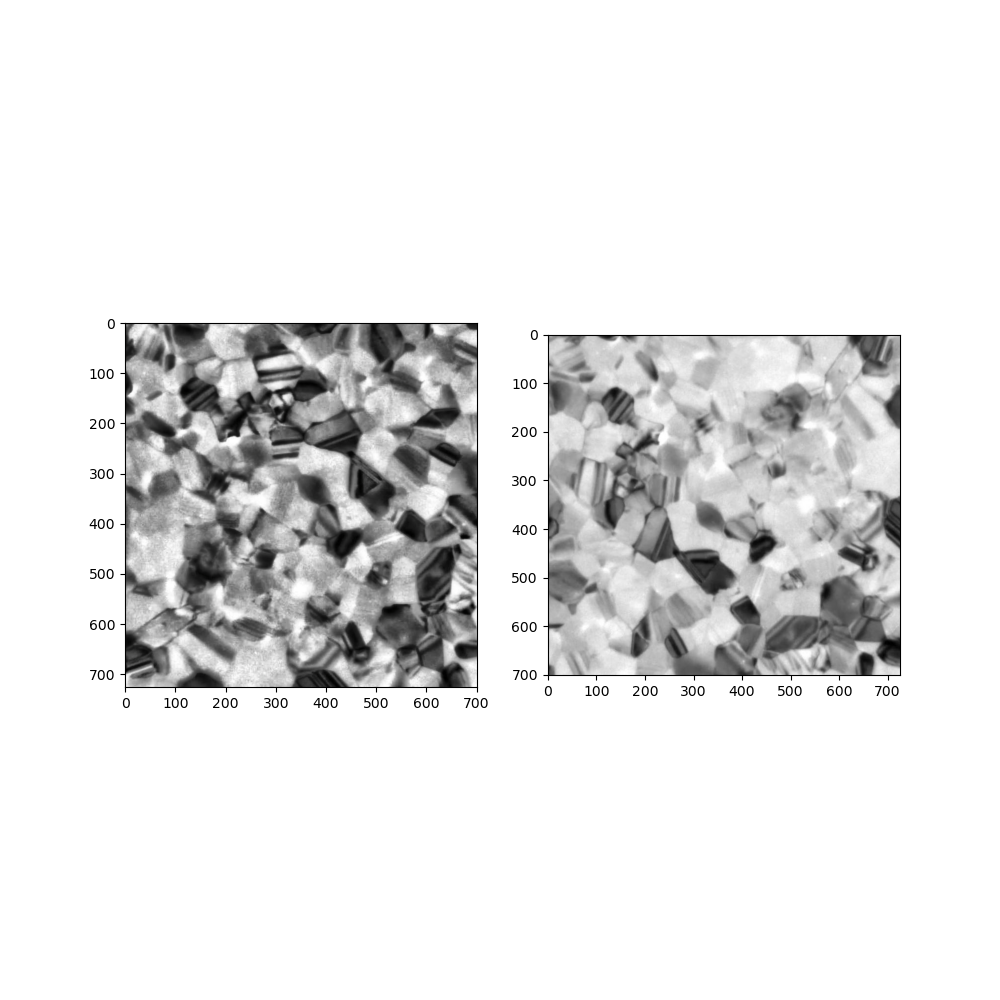

(132, 726, 702)


In [223]:
show_masks_on_image_2(raw_image,masks_mode_w1_closed)

In [191]:
#### Compare The one with all mask generated output with the ground Truth

In [192]:
#### Make a binary mask of the ground truth

import pickle
import cv2
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon
import os
import numpy as np

curr_dir = os.getcwd()
img_file = os.path.join(curr_dir,'cropped750.jpg')
img = cv2.imread(img_file)

def plot_polygon_2(pts_list,axis):
    polygon_patch = Polygon(pts_list,edgecolor = 'blue',facecolor = 'lightblue', alpha = 0.7)
    axis.add_patch(polygon_patch)
    
annotations_file = os.path.join(curr_dir,'gb_cropped750_polygons')

with open(annotations_file,"rb") as fp:
    annot_img = pickle.load(fp)

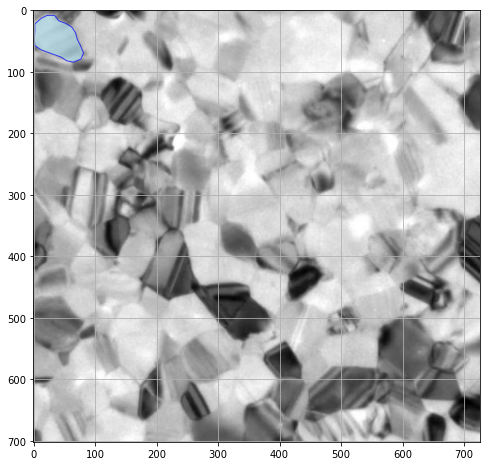

In [194]:
fig = plt.figure(figsize = (8,8))
plt.imshow(img)
plt.gca().set_aspect('equal',adjustable = 'box')
plt.grid(True)
for grains in annot_img:
    #print(grains)
    #print(grains.shape)
    plot_polygon_2(np.array(grains),plt.gca())
    break

In [195]:
polygon_patch = Polygon(grains,edgecolor = 'blue',facecolor = 'lightblue', alpha = 0.7)

In [200]:
polygon_patch

In [201]:
annot_img

[[[3, 21],
  [12, 13],
  [22, 8],
  [34, 8],
  [41, 17],
  [52, 21],
  [62, 27],
  [68, 36],
  [71, 47],
  [76, 57],
  [81, 69],
  [77, 79],
  [65, 84],
  [54, 82],
  [45, 76],
  [34, 72],
  [23, 68],
  [12, 64],
  [2, 57],
  [1, 46],
  [2, 34],
  [2, 23]],
 [[8, 66],
  [4, 77],
  [1, 88],
  [10, 95],
  [21, 98],
  [33, 96],
  [44, 101],
  [55, 104],
  [64, 96],
  [65, 85],
  [55, 79],
  [44, 76],
  [33, 73],
  [22, 68]],
 [[90, 1],
  [81, 8],
  [73, 17],
  [69, 27],
  [69, 39],
  [73, 50],
  [79, 60],
  [88, 68],
  [98, 73],
  [108, 79],
  [119, 81],
  [129, 76],
  [139, 69],
  [146, 59],
  [151, 49],
  [157, 38],
  [162, 27],
  [163, 16],
  [154, 9],
  [143, 8],
  [134, 15],
  [123, 15],
  [112, 10],
  [102, 6]],
 [[85, 70],
  [77, 79],
  [67, 82],
  [63, 94],
  [69, 103],
  [81, 100],
  [92, 94],
  [101, 85],
  [96, 75],
  [86, 70]],
 [[18, 97],
  [8, 104],
  [7, 116],
  [10, 127],
  [13, 138],
  [15, 150],
  [19, 161],
  [30, 165],
  [41, 170],
  [50, 175],
  [61, 180],
  [69, 173]

In [202]:
def plotStLine(x0,y0,x1,y1,temp_img):
    
    dx = abs(x1 - x0)
    if(x0<x1):
        sx=1
    else:
        sx = -1
        
    if(y0<y1):
        sy=1
    else:
        sy = -1
    
    dy = -abs(y1-y0)
    
    error = dy + dx
    
    while True:
        temp_img[y0][x0] = 1
        if(x0 == 0 and y0 == y1):
            break
        e2 = 2 * error
        
        if e2>=dy:
            if x0 == x1:
                break
            error = error + dy
            x0 = x0 + sx
        
        if e2<=dx:
            
            if y0 == y1:
                break
            error = error + dx
            y0 = y0 + sy
    
    return temp_img

In [203]:
def plotLineLow(x0,y0,x1,y1,temp_img):
    
    dx = x1 - x0
    dy = y1 - y0
    yi = 1
    if dy<0:
        yi = -1
        dy = -dy
    D = 2*dy - dx
    y = y0
    
    for x in range(x0,x1):
        
        temp_img[y][x] = 1
        if D>0:
            
            y = y+yi
            D = D + (2*(dy-dx))
        else:
            D = D + 2*dy
    
    return temp_img

In [204]:
def plotLineHigh(x0,y0,x1,y1):
    
    dx = x1 - x0
    dy = y1 - y0
    xi = 1
    
    if dx<0:
        
        xi = -1
        dx = -dx
    
    D = 2*dx - dy
    x = x0
    
    for y in range(y0,y1):
        
        temp_img[y][x] = 1
        if D>0:
            x = x +xi
            D = D + (2*(dx - dy))
        else:
            D = D + 2*dx
    
    return temp_img

In [205]:
def plotLine(x0,y0,x1,y1,temp_img):
    
    x0 = int(x0)
    y0 = int(y0)
    x1 = int(x1)
    y1 = int(y1)
    
    if (x0 == x1 or y0 == y1): return plotStLine(x0,y0,x1,y1,temp_img)
    
    if abs(y1-y0) < abs(x1-x0):
        if x0>x1:
            return plotLineLow(x1,y1,x0,y0,temp_img)
        else:
            return plotLineLow(x0,y0,x1,y1,temp_img)
    else:
        if y0 > y1:
            return plotLineHigh(x1,y1,x0,y0)
        else:
            return plotLineHigh(x0,y0,x1,y1)
        
    return temp_img

In [206]:
import shapely

ModuleNotFoundError: No module named 'shapely'

In [207]:
!pip3 -m install shapely


Usage:   
  pip3 <command> [options]

no such option: -m


In [208]:
!pip3 install shapely

Defaulting to user installation because normal site-packages is not writeable
     |████████████████████████████████| 2.3 MB 6.8 MB/s eta 0:00:01
You should consider upgrading via the '/usr/local/anaconda3/bin/python -m pip install --upgrade pip' command.


In [209]:
import shapely

In [210]:
height,width,_ = img.shape
height = height+1
width = width + 1
temp_img = np.zeros((height,width))

for grain in tqdm(annot_img):
    grain = shapely.Polygon(grain)
    gg_cords = list(grain.exterior.coords)


    for i in range(len(gg_cords)-1):

        x0,y0 = gg_cords[i]
        x1,y1 = gg_cords[i+1]
        temp_img = plotLine(x0,y0,x1,y1,temp_img)

100%|██████████| 133/133 [00:00<00:00, 5263.06it/s]


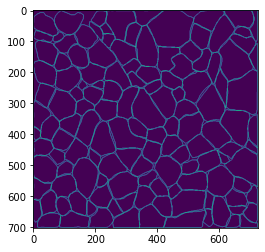

In [211]:
plt.imshow(temp_img)